<div align="center">
    <h1 style="font-size:50px;"><strong>Data Analysis 3 : Group 1 - L. Pezard & N. Catz - 2025</strong></h1>
</div>

<div align="center">
    <h1 style="font-size:40px;"><strong>Mélanie Barbosa-Grange, Godard Louise, Laura Marin & Mégane Barbosa-Grange</strong></h1>
</div>

<div align="center">
    <h1 style="font-size:40px;"><em>Frequency Coding of Multisensory Integration in the Local Field Potentials of the Associative Parietal Cortex</em></h1>
</div> 

## Imports

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io as sio
from scipy import stats
from itertools import combinations
import pandas as pd
from matplotlib.lines import Line2D
import warnings
from itertools import cycle
from statsmodels.stats.multitest import multipletests
from scipy.stats import ttest_1samp, ttest_rel, ttest_ind, kruskal, mannwhitneyu, friedmanchisquare, wilcoxon, shapiro 
import os
import mne
from scipy.signal import hilbert
import matplotlib.gridspec as gridspec
import seaborn as sns
import itertools
from matplotlib.colors import LinearSegmentedColormap
import scikit_posthocs as sp
from scipy.stats import circmean
from scipy.stats import f

## Initialisation - prétraitement sur tous les fichiers

In [30]:
rat_files = {
    'RAT61-013-01': 'RAT61-013-01.mat',
    'RAT61-014-01': 'RAT61-014-01.mat',
    'RAT61-015-01': 'RAT61-015-01.mat'
}
for rat_name, file_path in rat_files.items():
    data = sio.loadmat(file_path)
    output = f'output_{rat_name}'

    print(f"\n -----------\nTraitement des données pour le rat : {rat_name}\n")

    LFP = data['LFP']
    block = data['block']
    SpikeTiming = data['t_spike_su']
    StimStart = data['stim_start']

    warnings.filterwarnings("ignore", category=RuntimeWarning)


    LenTiming = np.zeros((16, 4), dtype=int)
    for i in range(16):
        for j in range(4):
            LenTiming[i, j] = len(SpikeTiming[i][j])

    su = np.zeros((16, 4), dtype=object)
    sualigned = np.zeros((16, 4), dtype=object)
    channelwithspike = []

    max_spike_time = 0
    for i in range(16):
        for j in range(4):
            if len(SpikeTiming[i][j]) > 0:
                max_spike_time = max(max_spike_time, np.max(SpikeTiming[i][j]))

    safe_length = max_spike_time + 900 

    for i in range(16):
        for j in range(4):
            if len(SpikeTiming[i][j]) > 50:
                print(f'Channel {i} Block {j+1} has {len(SpikeTiming[i][j])} spikes')
                channelwithspike.append((i, j))
                
                su[i, j] = np.zeros(safe_length, dtype=int)
                su[i, j][SpikeTiming[i][j] - 1] = 1
                
                sualigned[i, j] = np.zeros((len(StimStart), 1200), dtype=int)
                for trial in range(len(StimStart)):
                    start_idx = StimStart[trial, 0] - 300
                    end_idx = StimStart[trial, 0] + 900

                    if end_idx > len(su[i, j]):
                        end_idx = len(su[i, j])
                        start_idx = max(0, end_idx - 1200)  

                    sualigned[i, j][trial, :] = su[i, j][start_idx:end_idx]

    df_channelwithspike = pd.DataFrame(channelwithspike, columns=['Channel', 'Block'])
    df_channelwithspike.to_csv(os.path.join(output, f"{rat_name}_channels_with_spikes.csv"), index=False)

    triallist = [str(block[trial][0]) for trial in range(block.shape[0])]
    unique_conditions = np.unique(triallist)

    sfreq = int(data['adfreq'][0, 0]) 
    print(f'\nFréquence d\'échantillonnage: {sfreq} Hz')

    time_ms = np.arange(-300, 900)
    prestim_win = (-300, 0)
    prestim_len = prestim_win[1] - prestim_win[0]
    poststim_win = (0, 900)
    poststim_len = poststim_win[1] - poststim_win[0]

    channel_ids = list(range(len(channelwithspike)))

    triallist_clean = [t.strip("[]'\"") for t in triallist]
    prestim_mask = time_ms < prestim_win[1]
    poststim_mask = time_ms >= poststim_win[0]

    trial_arr = np.array(triallist_clean)
    starts = np.asarray(StimStart[:, 0]) - prestim_len
    ends = starts + prestim_len + poststim_len
    time_post = time_ms[poststim_mask]

    LFP_filtered = np.empty(LFP.shape[1], dtype=object)
    LFP_zscore = np.empty(LFP.shape[1], dtype=object) 

    for i in range(LFP.shape[1]):
        signal = np.squeeze(LFP[0, i]).astype(np.float64)
        signal_notch = mne.filter.notch_filter(signal, Fs=sfreq, freqs=[50], notch_widths=1.0, verbose='ERROR')
        signal_band = mne.filter.filter_data(signal_notch, sfreq=sfreq, l_freq=0.1, h_freq=300, verbose='ERROR')
        LFP_filtered[i] = signal_band 
        trials = np.zeros((len(StimStart), prestim_len + poststim_len))
        for t, onset in enumerate(StimStart[:, 0]):
            start = onset - prestim_len
            end = onset + poststim_len
            trials[t, :] = signal_band[start:end]

        baseline_mask = np.arange(prestim_len)
        trials_z = (trials - trials[:, baseline_mask].mean(axis=1, keepdims=True)) / \
                trials[:, baseline_mask].std(axis=1, keepdims=True)

        LFP_zscore[i] = trials_z


    np.save(os.path.join(output, f"{rat_name}_LFP_filtered.npy"), LFP_filtered, allow_pickle=True)
    np.save(os.path.join(output, f"{rat_name}_LFP_zscore.npy"), LFP_zscore, allow_pickle=True)
    print(f"\nFichiers sauvegardés : {rat_name}_LFP_filtered.npy et {rat_name}_LFP_zscore.npy")

    def classify_condition(cond):
        is_gr_left = 'GR_Left' in cond
        is_gr_right = 'GR_Right' in cond
        has_puff12 = 'PUFF_12' in cond
        has_puff34 = 'PUFF_34' in cond
        has_puff = 'PUFF' in cond
        has_gr = 'GR_' in cond

        if has_gr and not has_puff:
            return 'visual'
        elif has_puff and not has_gr:
            return 'tactile'
        else:
            if (has_puff12 and is_gr_left) or (has_puff34 and is_gr_right):
                return 'multisens_congruent'
            else:
                return 'multisens_incongruent'

    unique_cond_to_group = {cond: classify_condition(cond) for cond in sorted(set(triallist_clean))}


    group_cond = ['tactile', 'visual', 'multisens_congruent', 'multisens_incongruent']

    conditions = sorted(set(triallist_clean))

    LFP_by_condition_filtre = {cond: [] for cond in conditions}
    LFP_by_condition_zscore = {cond: [] for cond in conditions}
    SU_by_condition = {cond: [] for cond in conditions}

    LFP_by_group_filtre = {group: [] for group in group_cond}
    LFP_by_group_zscore = {group: [] for group in group_cond}
    SU_by_group = {group: [] for group in group_cond}


    n_trials = len(StimStart)

    for t in range(n_trials):

        cond = triallist_clean[t] 
        if cond not in unique_cond_to_group:
            print(f"Condition non trouvée : {cond}")

        group = unique_cond_to_group[cond]

        start = int(StimStart[t, 0] - prestim_len)
        end   = int(StimStart[t, 0] + poststim_len)

        lfp_trial_allch = np.vstack([LFP_filtered[ch][start:end] for ch in range(LFP.shape[1])])
        z_trial_allch   = np.vstack([LFP_zscore[ch][t] for ch in range(LFP.shape[1])])

        single_units = []
        for (chan, sb) in channelwithspike:
            single_units.append(sualigned[chan, sb][t])
        single_units = np.vstack(single_units) if single_units else np.zeros((0, end-start))

        LFP_by_condition_filtre[cond].append(lfp_trial_allch)
        LFP_by_condition_zscore[cond].append(z_trial_allch)
        SU_by_condition[cond].append(single_units)

        LFP_by_group_filtre[group].append(lfp_trial_allch)
        LFP_by_group_zscore[group].append(z_trial_allch)
        SU_by_group[group].append(single_units)


    for cond in conditions:
        group = unique_cond_to_group.get(cond, "Dans aucun groupe")
        print(f"{cond} --> {group}")

        LFP_by_condition_filtre[cond] = np.array(LFP_by_condition_filtre[cond], dtype=object)
        LFP_by_condition_zscore[cond] = np.array(LFP_by_condition_zscore[cond], dtype=object)
        SU_by_condition[cond] = np.array(SU_by_condition[cond], dtype=object)

    for g in group_cond:
        LFP_by_group_filtre[g] = np.array(LFP_by_group_filtre[g], dtype=object)
        LFP_by_group_zscore[g] = np.array(LFP_by_group_zscore[g], dtype=object)
        SU_by_group[g] = np.array(SU_by_group[g], dtype=object)



    np.save(os.path.join(output, f"{rat_name}_LFP_filtered_by_condition.npy"), LFP_by_condition_filtre, allow_pickle=True)
    np.save(os.path.join(output, f"{rat_name}_LFP_zscore_by_condition.npy"), LFP_by_condition_zscore, allow_pickle=True)
    np.save(os.path.join(output, f"{rat_name}_UnitActivity_by_condition.npy"), SU_by_condition, allow_pickle=True)

    np.save(os.path.join(output, f"{rat_name}_LFP_filtered_by_group.npy"), LFP_by_group_filtre, allow_pickle=True)
    np.save(os.path.join(output, f"{rat_name}_LFP_zscore_by_group.npy"), LFP_by_group_zscore, allow_pickle=True)
    np.save(os.path.join(output, f"{rat_name}_UnitActivity_by_group.npy"), SU_by_group, allow_pickle=True)

    print("\nSauvegardé :")
    print(" - LFP filtrées par condition + groupe")
    print(" - Z-scores par condition + groupe")
    print(" - Unités par condition + groupe")


 -----------
Traitement des données pour le rat : RAT61-013-01

Channel 0 Block 1 has 664 spikes
Channel 2 Block 1 has 3403 spikes
Channel 3 Block 1 has 258 spikes
Channel 8 Block 1 has 1176 spikes
Channel 9 Block 1 has 1191 spikes
Channel 10 Block 1 has 5479 spikes
Channel 11 Block 1 has 3853 spikes
Channel 15 Block 2 has 95 spikes

Fréquence d'échantillonnage: 1000 Hz

Fichiers sauvegardés : RAT61-013-01_LFP_filtered.npy et RAT61-013-01_LFP_zscore.npy
GR_Left_CS_5 --> visual
GR_Left_CS_5_PUFF_12 --> multisens_congruent
GR_Left_CS_5_PUFF_34 --> multisens_incongruent
GR_Right_CS_5 --> visual
GR_Right_CS_5_PUFF_12 --> multisens_incongruent
GR_Right_CS_5_PUFF_34 --> multisens_congruent
PUFF_12 --> tactile
PUFF_34 --> tactile

Sauvegardé :
 - LFP filtrées par condition + groupe
 - Z-scores par condition + groupe
 - Unités par condition + groupe

 -----------
Traitement des données pour le rat : RAT61-014-01

Channel 0 Block 1 has 2888 spikes
Channel 2 Block 1 has 6866 spikes
Channel 3 Bl

In [73]:
rat_name = 'RAT61-013-01' 
output = f'output_{rat_name}'

LFP_filtered_by_group_ = np.load(f"output_{rat_name}/{rat_name}_LFP_filtered_by_group.npy", allow_pickle=True).item()
LFP_zscore_by_group = np.load(f"output_{rat_name}/{rat_name}_LFP_zscore_by_group.npy", allow_pickle=True).item()
LFP_filtered_by_cond = np.load(f"output_{rat_name}/{rat_name}_LFP_filtered_by_condition.npy", allow_pickle=True).item()
LFP_zscore_by_cond = np.load(f"output_{rat_name}/{rat_name}_LFP_zscore_by_condition.npy", allow_pickle=True).item()

group_order = ['tactile', 'visual', 'multisens_congruent', 'multisens_incongruent']

conditions = sorted(LFP_filtered_by_cond.keys())

channelwithspike = pd.read_csv(os.path.join(f'output_{rat_name}', f"{rat_name}_channels_with_spikes.csv"))
channel_ids = list(range(len(channelwithspike)))

sfreq = 1000

time_ms = np.arange(-300, 900)
prestim_win = (-300, 0)
prestim_len = prestim_win[1] - prestim_win[0]
poststim_win = (0, 900)
poststim_len = poststim_win[1] - poststim_win[0]

prestim_mask = time_ms < prestim_win[1]
poststim_mask = time_ms >= poststim_win[0]

time_post = time_ms[poststim_mask]

# **I - Local Field Potentials in the Time Domain (Evoked Potentials)**

## 1. On commence par vérifier que les baselines ne sont pas significativement différentes entre les conditions

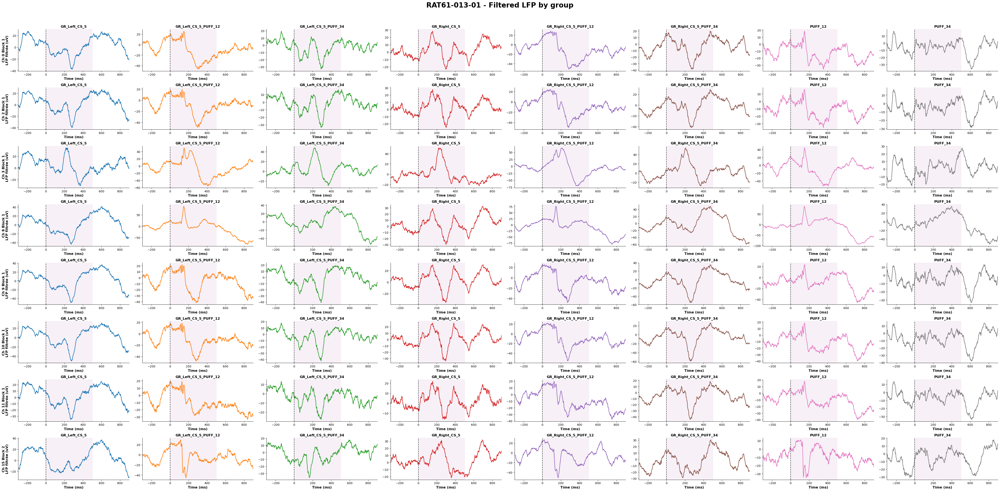

,channel,subunit,n_groups_tested,n_trials_per_group,H,p,p_bonf,significant_bonf
0,0,0,8,"{'GR_Left_CS_5': 20, 'GR_Left_CS_5_PUFF_12': 2...",10.018556,0.187524,1.0,False
1,2,0,8,"{'GR_Left_CS_5': 20, 'GR_Left_CS_5_PUFF_12': 2...",9.563059,0.214716,1.0,False
2,3,0,8,"{'GR_Left_CS_5': 20, 'GR_Left_CS_5_PUFF_12': 2...",4.991134,0.661045,1.0,False
3,8,0,8,"{'GR_Left_CS_5': 20, 'GR_Left_CS_5_PUFF_12': 2...",5.739084,0.570524,1.0,False
4,9,0,8,"{'GR_Left_CS_5': 20, 'GR_Left_CS_5_PUFF_12': 2...",5.625559,0.584085,1.0,False
5,10,0,8,"{'GR_Left_CS_5': 20, 'GR_Left_CS_5_PUFF_12': 2...",9.103230,0.245329,1.0,False
6,11,0,8,"{'GR_Left_CS_5': 20, 'GR_Left_CS_5_PUFF_12': 2...",11.269938,0.127270,1.0,False
7,15,1,8,"{'GR_Left_CS_5': 20, 'GR_Left_CS_5_PUFF_12': 2...",8.626817,0.280571,1.0,False



Aucune différences significatives avec Kruskal. Pas de tests post-hoc effectués.


In [74]:
kruskal_results = []
alpha = 0.05
n_cols = len(conditions)
n_rows = len(channel_ids)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 3 * n_rows), squeeze=False)

row = 0 

for i, (channel, subunit) in enumerate(channelwithspike.itertuples(index=False)):

    trials_per_group = {}

    for g in conditions:
        group_trials = LFP_filtered_by_cond[g]  
        if len(group_trials) == 0:
            continue

        trials_ch = np.array([trial[channel] for trial in group_trials])
        trials_per_group[g] = trials_ch

    groups_present = list(trials_per_group.keys())
    colors = plt.cm.tab10.colors

    for col, g in enumerate(groups_present):
        ax = axes[row, col]
        trials = trials_per_group[g]

        mean_lfp = trials.mean(axis=0)
        time_vec = np.arange(mean_lfp.size) - prestim_len

        ax.plot(time_vec, mean_lfp, color='0.8', linewidth=1.0)
        ax.plot(time_vec, mean_lfp, color=colors[col % len(colors)], linewidth=1.8)

        ax.axvline(0, color='k', linestyle='--', alpha=0.7)
        ax.set_title(g, fontsize=12, fontweight='bold')

        if col == 0:
            ax.set_ylabel(f'Ch {channel} Block {subunit+1}\nLFP filtrée (uV)', fontsize=12, fontweight='bold')
        ax.set_xlabel('Time (ms)', fontsize=12, fontweight='bold')

        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

        ax.axvspan(0, 500, color='purple', alpha=0.06, zorder=0)
        ax.set_xlim(time_vec.min(), time_vec.max())

    for col in range(len(groups_present), n_cols):
        axes[row, col].set_visible(False)

    if len(groups_present) >= 2:
        groups_for_kruskal = []
        n_trials_per_group = {}

        for g in groups_present:
            trials = trials_per_group[g]
            n_trials_per_group[g] = trials.shape[0]
            groups_for_kruskal.append(trials[:, prestim_mask].mean(axis=1))

        H, p = stats.kruskal(*groups_for_kruskal)
        p_bonf = min(p * len(channelwithspike), 1.0)

        kruskal_results.append({
            'channel': channel,
            'subunit': subunit,
            'n_groups_tested': len(groups_present),
            'n_trials_per_group': n_trials_per_group,
            'H': H,
            'p': p,
            'p_bonf': p_bonf,
            'significant_bonf': (p_bonf < alpha)
        })

    row += 1

plt.suptitle(f'{rat_name} - Filtered LFP by group', fontsize=24, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.savefig(os.path.join(output, f'{rat_name}_LFPfilt_per_channel_by_cond.png'), dpi=300, bbox_inches='tight', transparent=True)
plt.show()

summary = pd.DataFrame(kruskal_results)
display(summary)

if not summary.empty and summary['significant_bonf'].any():
    print("\n Un test post-hoc doit être effectué")
else:
    print("\nAucune différences significatives avec Kruskal. Pas de tests post-hoc effectués.")

## Z-Score

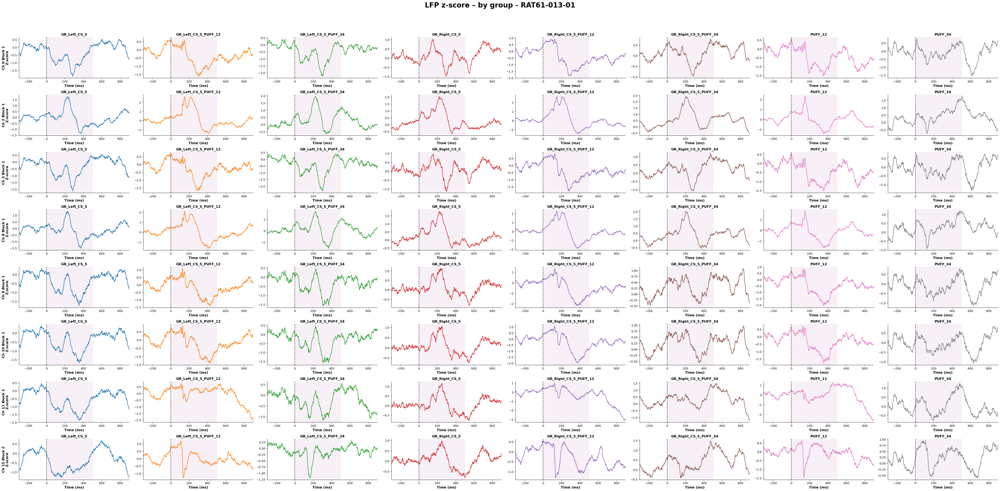

In [75]:
n_cols = len(conditions)
n_rows = len(channelwithspike)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 3 * n_rows), squeeze=False)

row = 0 

for i, (channel, subunit) in enumerate(channelwithspike.itertuples(index=False)):

    trials_per_group = {}

    for g in conditions:
        list_trials = LFP_zscore_by_cond[g]  
        if len(list_trials) == 0:
            continue

        trials_ch = np.array([trial[i] for trial in list_trials])
        trials_per_group[g] = trials_ch

    groups_present = list(trials_per_group.keys())
    colors = plt.cm.tab10.colors

    for ci, g in enumerate(groups_present):
        ax = axes[row, ci]
        trials = trials_per_group[g]

        mean_z = trials.mean(axis=0)
        time_vec = np.arange(mean_z.size) - prestim_len

        ax.plot(time_vec, mean_z, color='0.8', linewidth=1.0)
        ax.plot(time_vec, mean_z, color=colors[ci % len(colors)], linewidth=1.6)

        ax.axvline(0, color='k', linestyle='--', alpha=0.7)
        ax.set_title(g, fontsize=12, fontweight='bold')
        ax.set_xlabel('Time (ms)', fontsize=12, fontweight='bold')

        if ci == 0:
            ax.set_ylabel(f'Ch {channel} Block {subunit+1}\nZ-score', fontsize=12, fontweight='bold')

        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

        ax.axvspan(0, 500, color='purple', alpha=0.06, zorder=0)
        ax.set_xlim(time_vec.min(), time_vec.max())

    for ci in range(len(groups_present), n_cols):
        axes[row, ci].set_visible(False)

    row += 1


plt.suptitle(f'LFP z-score – by group - {rat_name}\n', fontsize=24, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.savefig(os.path.join(output, f'{rat_name}_lfp_zscore_per_channel_by_cond.svg'), dpi=300, bbox_inches='tight', format='svg', transparent=True)
plt.show()

## 2. Analyse du signal post-stimulus par rapport au pré-stimulus

,channel,block,cond,n_trials,W,pval,p_bonf,sig_bonf
0,0,1,GR_Left_CS_5,16,65.0,0.899933,1.000000,False
1,0,1,GR_Left_CS_5_PUFF_12,16,7.0,0.000580,0.004639,True
2,0,1,GR_Left_CS_5_PUFF_34,16,18.0,0.007629,0.061035,False
3,0,1,GR_Right_CS_5,16,0.0,0.000031,0.000244,True
4,0,1,GR_Right_CS_5_PUFF_12,16,59.0,0.668549,1.000000,False
...,...,...,...,...,...,...,...,...
59,15,2,GR_Right_CS_5,16,0.0,0.000031,0.000244,True
60,15,2,GR_Right_CS_5_PUFF_12,16,14.0,0.003357,0.026855,True
61,15,2,GR_Right_CS_5_PUFF_34,16,65.0,0.899933,1.000000,False
62,15,2,PUFF_12,16,29.0,0.044312,0.354492,False


Test du Chi2 : Chi2 = 6.776470588235294, p-value = 0.4525189862554371


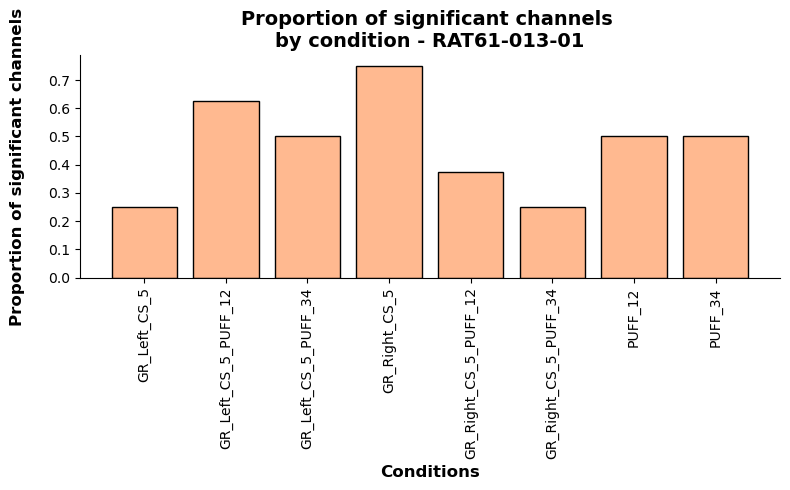

In [76]:
results_all = []
n_tests = len(conditions)
alpha = 0.05
for i, (channel, subunit) in enumerate(channelwithspike.itertuples(index=False)):
    for grp in conditions:

        trials_cond = LFP_zscore_by_cond[grp][i]

        tm2 = np.arange(trials_cond.shape[1]) - prestim_len
        bm = (tm2 >= prestim_win[0]) & (tm2 < prestim_win[1])
        pm = (tm2 >= poststim_win[0]) & (tm2 < poststim_win[1])

        baseline_means = np.array([trial[bm].mean() for trial in trials_cond], dtype=float)
        post_means = np.array([trial[pm].mean() for trial in trials_cond], dtype=float)

        W, pval = wilcoxon(post_means, baseline_means, alternative='two-sided')

        p_bonf = min(pval * n_tests, 1.0)
        sig_bonf = (p_bonf < alpha)

        results_all.append({
            "channel": channel,
            "block": subunit+1,
            "cond": grp,
            "n_trials": trials_cond.shape[0],
            "W": W,
            "pval": pval,
            "p_bonf": p_bonf,
            "sig_bonf": sig_bonf
        })

df_results_all = pd.DataFrame(results_all)
display(df_results_all)

if not df_results_all['sig_bonf'].any():
    print("Aucune différences significatives avec Wilcoxon (après correction Bonferroni).")

from scipy.stats import chi2_contingency

canaux_sig_par_cond = {}
canaux_non_sig_par_cond = {}
proportion_sig_par_cond = {}

for cond in df_results_all['cond'].unique():
    df_cond = df_results_all[df_results_all['cond'] == cond]
    nb_canaux_sig = df_cond[df_cond['sig_bonf'] == True].shape[0]
    nb_canaux_non_sig = df_cond[df_cond['sig_bonf'] == False].shape[0]

    canaux_sig_par_cond[cond] = nb_canaux_sig
    canaux_non_sig_par_cond[cond] = nb_canaux_non_sig
    proportion_sig_par_cond[cond] = nb_canaux_sig / len(channelwithspike)

contingency_table = []
for cond in df_results_all['cond'].unique():
    contingency_table.append([canaux_non_sig_par_cond[cond], canaux_sig_par_cond[cond]])

chi2, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"Test du Chi2 : Chi2 = {chi2}, p-value = {p_value}")

plt.figure(figsize=(8, 5))
plt.bar(canaux_sig_par_cond.keys(), proportion_sig_par_cond.values(), color="#ffb990", edgecolor='black')
plt.xlabel('Conditions', fontsize=12, fontweight='bold')
plt.ylabel('Proportion of significant channels\n', fontsize=12, fontweight='bold')
plt.title(f'Proportion of significant channels \nby condition - {rat_name}', fontsize=14, fontweight='bold')
plt.xticks(rotation=90)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tight_layout()
plt.savefig(os.path.join(output, f'{rat_name}_proportion_significant_channels_per_condition.svg'), dpi=300, bbox_inches='tight', format='svg', transparent=True)
plt.show()

## 3. Analyse des amplitudes a chaque timestamps (Kruskal)

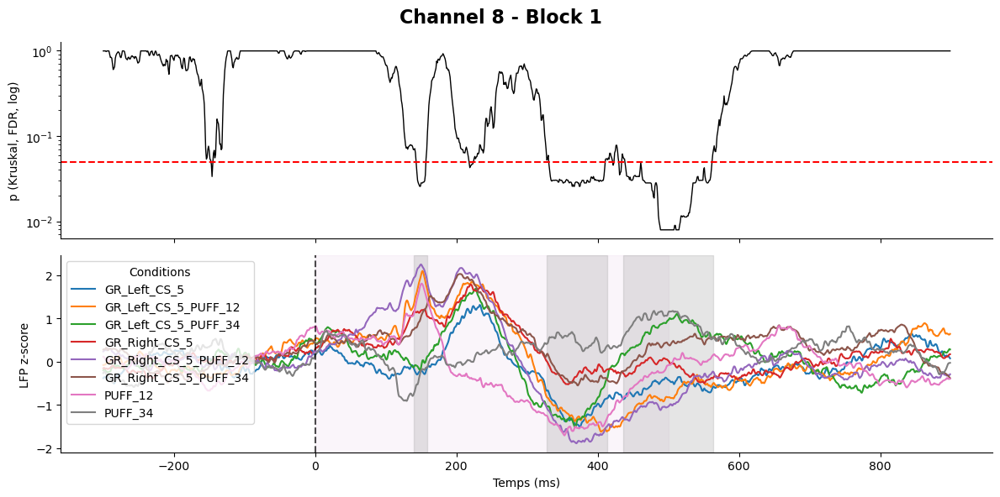

In [77]:
window_size = 15
min_significant = 12
alpha = 0.05

def find_significant_periods(p_values, alpha=0.05, window_size=15, min_significant=12):
    significant = (p_values < alpha)
    n = len(significant)
    mask = np.zeros(n, dtype=bool)
    for start in range(n - window_size + 1):
        if significant[start:start+window_size].sum() >= min_significant:
            mask[start:start+window_size] = True
    return mask

def get_time_ranges(mask, time_array):
    ranges = []
    in_range = False
    for i, m in enumerate(mask):
        if m and not in_range:
            start_idx = i
            in_range = True
        elif not m and in_range:
            ranges.append((time_array[start_idx], time_array[i-1]))
            in_range = False
    if in_range:
        ranges.append((time_array[start_idx], time_array[-1]))
    return ranges

significant_results = []
colors = plt.cm.tab10.colors

for i, (channel, subunit) in enumerate(channelwithspike.itertuples(index=False)):

    trials_per_group = {}
    for g in conditions:
        list_trials = LFP_zscore_by_cond[g]  
        if len(list_trials) == 0:
            continue

        trials_ch = np.array([trial[i] for trial in list_trials])
        trials_per_group[g] = trials_ch

    groups_present = list(trials_per_group.keys())


    n_times = next(iter(trials_per_group.values())).shape[1]  
    time_plot = time_ms 

    kruskal_p = np.full(n_times, np.nan)
    for t_idx in range(n_times):
        samples = [trials_per_group[g][:, t_idx] for g in groups_present]
        kruskal_p[t_idx] = stats.kruskal(*samples).pvalue

    valid_mask = ~np.isnan(kruskal_p)
    kruskal_p[valid_mask] = multipletests(kruskal_p[valid_mask], alpha=alpha, method='fdr_bh')[1]

    kruskal_sig_mask = find_significant_periods(kruskal_p, alpha=alpha, window_size=window_size, min_significant=min_significant)
    kruskal_clusters = get_time_ranges(kruskal_sig_mask, time_plot)

    pairs = list(combinations(groups_present, 2))
    posthoc_p = {pair: np.ones(n_times) for pair in pairs}

    sig_indices = np.where(kruskal_sig_mask)[0]

    for t_idx in sig_indices:

        df_dunn = pd.concat([pd.DataFrame({"value": trials_per_group[g][:, t_idx], "group": g}) for g in groups_present], ignore_index=True)
        dunn_df = sp.posthoc_dunn(df_dunn, val_col='value', group_col='group', p_adjust='bonferroni')
        
        for a, b in pairs:
            posthoc_p[(a, b)][t_idx] = dunn_df.loc[a, b]

    posthoc_sig_masks = {pair: find_significant_periods(pv, alpha=alpha, window_size=window_size, min_significant=min_significant) for pair, pv in posthoc_p.items()}

    for pair, mask in posthoc_sig_masks.items():
        if mask.any():
            time_ranges = get_time_ranges(mask, time_plot)
            significant_results.append({
                'channel': channel,
                'block': subunit+1,
                'conditions': pair,
                'time_ranges': time_ranges
            })

    if channel == 8:
        fig, (ax_p, ax_mean) = plt.subplots(2,1, figsize=(12,6), sharex=True)

        ax_p.plot(time_plot, np.clip(kruskal_p,1e-300,1), color='k', lw=1)
        ax_p.axhline(alpha, color='red', linestyle='--')
        ax_p.set_yscale('log')
        ax_p.set_ylabel('p (Kruskal, FDR, log)')
        ax_p.spines['top'].set_visible(False)
        ax_p.spines['right'].set_visible(False)

        for idx, g in enumerate(groups_present):
            mean_trace = trials_per_group[g].mean(axis=0)
            ax_mean.plot(time_plot, mean_trace, color=colors[idx % 10], label=g, lw=1.5)

        for ts, te in kruskal_clusters:
            ax_mean.axvspan(ts, te, color='gray', alpha=0.2)

        ax_mean.set_xlabel('Temps (ms)')
        ax_mean.set_ylabel('LFP z-score')
        ax_mean.axvline(0, color='k', linestyle='--', alpha=0.7)
        ax_mean.legend(title='Conditions', loc='upper left')
        ax_mean.spines['top'].set_visible(False)
        ax_mean.spines['right'].set_visible(False)
        ax_mean.axvspan(0, 500, color='purple', alpha=0.04, zorder=0)


        plt.suptitle(f'Channel {channel} - Block {subunit+1}', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.savefig(os.path.join(output, f'{rat_name}_posthoc_channel{channel}_block{subunit+1}_by_cond.svg'), dpi=300, bbox_inches='tight', format='svg', transparent=True)
        plt.show()


,channel,block,pair,n_clusters,total_sig_time_ms,clusters
0,2,1,GR_Left_CS_5 vs GR_Left_CS_5_PUFF_34,1,21,"[(512, 533)]"
1,2,1,GR_Left_CS_5 vs GR_Right_CS_5_PUFF_12,1,20,"[(140, 160)]"
2,2,1,GR_Left_CS_5 vs GR_Right_CS_5_PUFF_34,1,28,"[(543, 571)]"
3,2,1,GR_Left_CS_5 vs PUFF_34,2,105,"[(346, 367), (482, 566)]"
4,2,1,GR_Left_CS_5_PUFF_12 vs GR_Left_CS_5_PUFF_34,1,33,"[(486, 519)]"
5,2,1,GR_Left_CS_5_PUFF_12 vs PUFF_34,1,110,"[(455, 565)]"
6,2,1,GR_Left_CS_5_PUFF_34 vs GR_Right_CS_5_PUFF_12,1,33,"[(494, 527)]"
7,2,1,GR_Right_CS_5_PUFF_12 vs PUFF_34,2,136,"[(343, 411), (474, 542)]"
8,2,1,PUFF_12 vs PUFF_34,1,32,"[(335, 367)]"
9,8,1,GR_Left_CS_5 vs GR_Right_CS_5_PUFF_12,1,23,"[(137, 160)]"


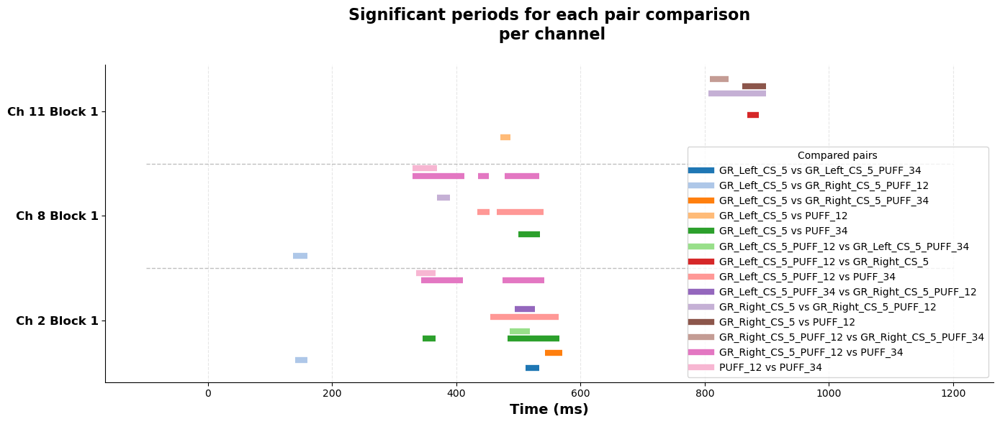

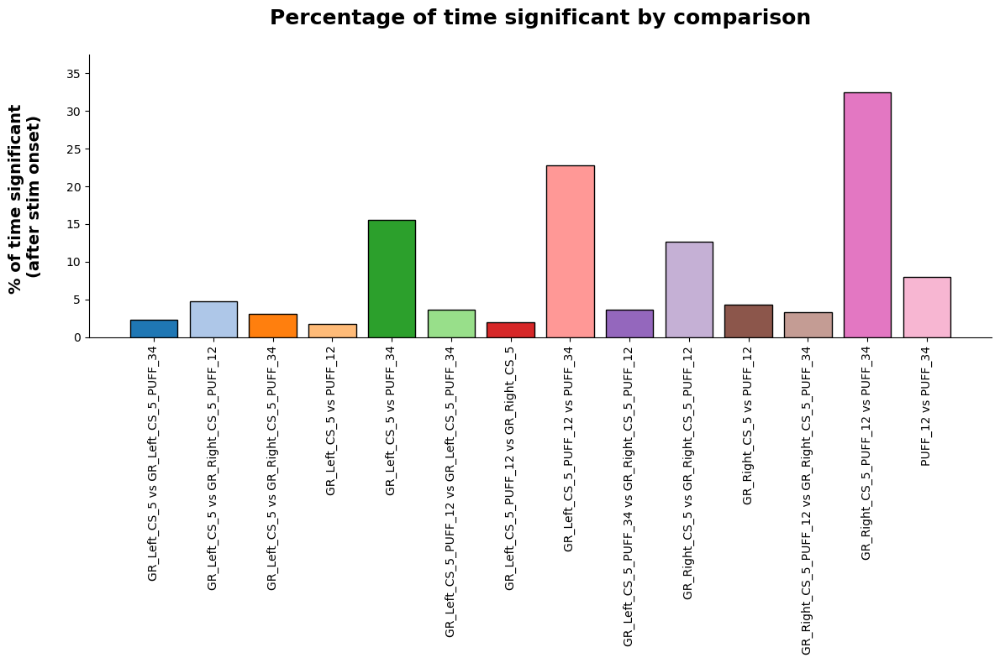

Chi²=1263.15, p=0.0000


In [78]:
rows = []
for res in significant_results:
    total_time = sum(te - ts for ts, te in res['time_ranges'])
    rows.append({
        "channel": res["channel"],
        "block": res["block"],
        "pair": f"{res['conditions'][0]} vs {res['conditions'][1]}",
        "n_clusters": len(res["time_ranges"]),
        "total_sig_time_ms": total_time,
        "clusters": res["time_ranges"],
    })

df = pd.DataFrame(rows)
display(df)

df.to_csv(os.path.join(output, f"{rat_name}_Summary_Dunn_Significance.csv"), index=False)

pair_list = sorted(df["pair"].unique())
base_colors = list(plt.cm.tab20.colors)
color_map = {pair: base_colors[i % len(base_colors)] for i, pair in enumerate(pair_list)}

n_pairs = len(pair_list)
offsets = np.linspace(-0.25, 0.25, n_pairs) 
pair_offset = {pair: offsets[i] for i, pair in enumerate(pair_list)}

y_spacing = 0.55  
offset_max = 0.25 

plt.figure(figsize=(14, 6))

y_labels = []
y_pos = []

for idx, ((ch, block), group) in enumerate(df.groupby(["channel", "block"])):
    y = idx * y_spacing
    y_labels.append(f"Ch {ch} Block {block}")
    y_pos.append(y)
    if idx > 0:
        plt.hlines(y - y_spacing/2, xmin=-100, xmax=1200, colors='gray', linestyles='dashed', linewidth=1, alpha=0.5)
    for _, row in group.iterrows():
        offset = pair_offset[row["pair"]] * (offset_max / 0.25)
        y_line = y + offset

        for (ts, te) in row["clusters"]:
            plt.hlines(y_line, ts, te, color=color_map[row["pair"]], linewidth=6)

plt.yticks(y_pos, y_labels, fontsize=12, fontweight='bold')
plt.xlabel("Time (ms)", fontsize=14, fontweight='bold')
plt.title("Significant periods for each pair comparison\n per channel\n", fontsize=16, fontweight='bold')
plt.grid(axis="x", linestyle="--", alpha=0.3)
plt.legend([plt.Line2D([0], [0], color=color_map[p], lw=6) for p in pair_list],
           pair_list, title="Compared pairs", loc="lower right")
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tight_layout()
plt.savefig(os.path.join(output, f"{rat_name}_Dunn_Timeline_Compact.svg"), dpi=300, transparent=True)
plt.show()


time_poststim_total = 900  

pair_total_time = {}
for pair in pair_list:
    total = 0
    for clusters in df[df["pair"] == pair]["clusters"]:
        for ts, te in clusters:
            total += te - ts
    pair_total_time[pair] = total

pair_percent = {pair: (total / time_poststim_total) * 100 for pair, total in pair_total_time.items()}

plt.figure(figsize=(12,8))
pairs = list(pair_percent.keys())
percentages = [pair_percent[p] for p in pairs]

plt.bar(pairs, percentages, color=[color_map[p] for p in pairs], edgecolor='black')
plt.ylabel("% of time significant \n(after stim onset)\n", fontsize=14, fontweight='bold')
plt.title("Percentage of time significant by comparison\n", fontsize=18, fontweight='bold')
plt.xticks(rotation=90)
plt.ylim(0, np.max(percentages) + 5)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.tight_layout()
plt.savefig(os.path.join(output, f"{rat_name}_Dunn_Percent_Time_Significant.svg"), dpi=300, transparent=True)
plt.show()

contingency = []
for pair in pair_list:
    sig_time = sum(te-ts for clusters in df[df["pair"]==pair]["clusters"] for ts, te in clusters)
    nonsig_time = time_poststim_total - sig_time
    contingency.append([sig_time, nonsig_time])

chi2, p, dof, expected = chi2_contingency(contingency)
print(f"Chi²={chi2:.2f}, p={p:.4f}")


# **II - Latency Analyses**


Canal 0 - Block 1 : Kruskal p=1.09e-01 - Pas de différences significatives entre groupes.

Canal 2 - Block 1 : Kruskal p=9.56e-01 - Pas de différences significatives entre groupes.

Canal 3 - Block 1 : Kruskal p=7.32e-02 - Pas de différences significatives entre groupes.


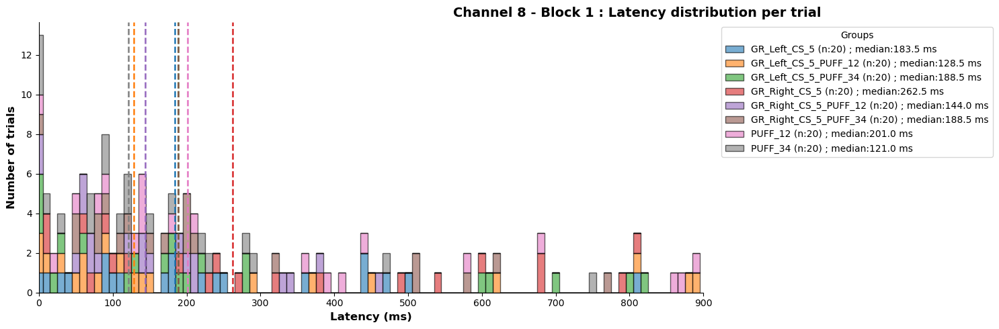


Canal 8 - Block 1 : Kruskal p=3.49e-01 - Pas de différences significatives entre groupes.

Canal 9 - Block 1 : Kruskal p=5.72e-01 - Pas de différences significatives entre groupes.

Canal 10 - Block 1 : Kruskal p=3.44e-01 - Pas de différences significatives entre groupes.

Canal 11 - Block 1 : Kruskal p=6.99e-01 - Pas de différences significatives entre groupes.

Canal 15 - Block 2 : Kruskal p=8.28e-01 - Pas de différences significatives entre groupes.


In [79]:
bins = np.arange(0, 901, 10)
n_comp = max(1, len(conditions)*(len(conditions)-1)//2)
dureemin_ms = 5
sustain_samples = max(1, int(round(dureemin_ms * sfreq / 1000)))
colors = plt.cm.tab10.colors


def plot_significance(ax, x1, x2, counts_stack, star_positions, star_gap=1.0):
    bin_idx1 = np.digitize(x1, bins) - 1
    bin_idx2 = np.digitize(x2, bins) - 1
    bin_idx1 = np.clip(bin_idx1, 0, len(counts_stack)-1)
    bin_idx2 = np.clip(bin_idx2, 0, len(counts_stack)-1)
    lo, hi = sorted([bin_idx1, bin_idx2])
    bin_key = (lo, hi)
    segment = counts_stack[lo:hi+1]
    y_base = np.max(segment) + 1.5 if segment.size > 0 else 1.5

    overlap_count = 0
    for existing in star_positions.keys():
        if not isinstance(existing, tuple): continue
        e1, e2 = existing
        if not (e2 < lo or e1 > hi):
            overlap_count += 1
    y = y_base + overlap_count * star_gap
    star_positions[bin_key] = y
    ax.plot([x1, x2], [y, y], 'k', linewidth=1.2)
    ax.plot([x1, x1], [y-0.2, y], 'k', linewidth=1.2)
    ax.plot([x2, x2], [y-0.2, y], 'k', linewidth=1.2)
    ax.text((x1+x2)/2, y+0.05, '*', ha='center', va='bottom', fontsize=14, fontweight='bold')

def find_significant_periods(p_values, alpha=0.05, window_size=15, min_significant=12):
    significant = (p_values < alpha)
    n = len(significant)
    mask = np.zeros(n, dtype=bool)
    for start in range(n - window_size + 1):
        if significant[start:start+window_size].sum() >= min_significant:
            mask[start:start+window_size] = True
    return mask

def get_time_ranges(mask, time_array):
    ranges = []
    in_range = False
    for i, m in enumerate(mask):
        if m and not in_range:
            start_idx = i
            in_range = True
        elif not m and in_range:
            ranges.append((time_array[start_idx], time_array[i-1]))
            in_range = False
    if in_range:
        ranges.append((time_array[start_idx], time_array[-1]))
    return ranges

latencies_by_channel = {}

for i, (channel, subunit) in enumerate(channelwithspike.itertuples(index=False)):

    trials_per_group = {}
    thresholds = {}

    for grp in conditions:
        trials_cond = LFP_zscore_by_cond[grp][:, i, :]
        trials_per_group[grp] = trials_cond
        if trials_cond.size == 0:
            thresholds[grp] = np.nan
        else:
            all_pre = trials_cond[:, :prestim_len].flatten()
            median_pre = np.median(all_pre)
            iqr_pre = np.percentile(all_pre, 75) - np.percentile(all_pre, 25)
            thresholds[grp] = median_pre + 2 * iqr_pre

    group_trial_latencies = {g: [] for g in conditions}
    for grp in conditions:
        trials_cond = trials_per_group[grp]
        thr = thresholds[grp]
        if trials_cond.size == 0: continue

        for trial in trials_cond:
            post_signal = trial[prestim_len:]
            latency = np.nan
            if post_signal.size == 0 or np.isnan(thr):
                continue
            above = np.abs(post_signal) > thr
            run_start = None
            count = 0
            for i, val in enumerate(above):
                if val:
                    count += 1
                    if count >= sustain_samples:
                        run_start = i - sustain_samples + 1
                        break
                else:
                    count = 0
            if run_start is not None:
                latency = time_post[run_start]
            else:
                latency = time_post[np.argmax(np.abs(post_signal))]
            group_trial_latencies[grp].append(latency)

    latencies_by_channel[i] = group_trial_latencies

    n_times = 1
    kruskal_p = np.nan
    samples = [np.array(group_trial_latencies[g])[np.isfinite(group_trial_latencies[g])] for g in conditions if len(group_trial_latencies[g])>0]
    if len(samples) > 1:
        kruskal_p = stats.kruskal(*samples).pvalue


    posthoc_p = {pair: np.nan for pair in combinations(conditions, 2)}
    if kruskal_p < 0.05:
        df_dunn = pd.concat([
            pd.DataFrame({"value": np.array(group_trial_latencies[g]), "group": g}) 
            for g in conditions
        ], ignore_index=True)
        dunn_df = sp.posthoc_dunn(df_dunn, val_col='value', group_col='group', p_adjust='bonferroni')
        for a, b in posthoc_p.keys():
            posthoc_p[(a,b)] = dunn_df.loc[a, b]

    if channel == 8:
        plt.figure(figsize=(15,5))
        counts_stack = np.zeros(len(bins)-1)
        stack_bottom = np.zeros(len(bins)-1)
        medians = {g: np.nanmedian(group_trial_latencies[g]) for g in conditions}

        for idx, g in enumerate(conditions):
            data = np.array(group_trial_latencies[g])
            data = data[np.isfinite(data)]
            counts, _ = np.histogram(data, bins=bins)
            plt.bar(bins[:-1], counts, bottom=stack_bottom, width=np.diff(bins),
                    color=colors[idx % 10], edgecolor='black', alpha=0.6,
                    label=f"{g} (n:{data.size}) ; median:{medians[g]:.1f} ms")
            stack_bottom += counts
            counts_stack += counts
            plt.axvline(medians[g], color=colors[idx % 10], linestyle='--', linewidth=1.8)

        star_positions = {}
        for (a, b), pval in posthoc_p.items():
            if not np.isnan(pval) and pval < 0.05:
                plot_significance(plt.gca(), medians[a], medians[b], counts_stack, star_positions)

        plt.xlabel("Latency (ms)", fontsize=12, fontweight='bold')
        plt.ylabel("Number of trials", fontsize=12, fontweight='bold')
        plt.title(f"Channel {channel} - Block {subunit+1} : Latency distribution per trial", fontsize=14, fontweight='bold', x=0.9)
        plt.xlim(0, 900)
        plt.legend(title="Groups", bbox_to_anchor=(1.02,1), loc='upper left')
        plt.gca().spines['top'].set_visible(False)
        plt.gca().spines['right'].set_visible(False)
        plt.tight_layout()
        plt.savefig(os.path.join(output, f'{rat_name}_LFP_latency_ch{channel}_block{subunit+1}.svg'), dpi=300, bbox_inches='tight', format='svg', transparent=True)
        plt.show()

    if kruskal_p < 0.05:
        print(f"\nCanal {channel} - Block {subunit+1} : Kruskal p={kruskal_p:.4e} - Tests post-hoc")
        for (a, b), pval in posthoc_p.items():
            if pval < 0.05:
                print(f" --> {a} vs {b} : p={pval:.4e} (significatif)")
                
        if all(p >= 0.05 for p in posthoc_p.values()):
            print(" - Aucune différence significative entre paires.")
    else:
        print(f"\nCanal {channel} - Block {subunit+1} : Kruskal p={kruskal_p:.2e} - Pas de différences significatives entre groupes.")

# **III - Analyse fréquencielle**

## 1. Time-frequency (Morlet)

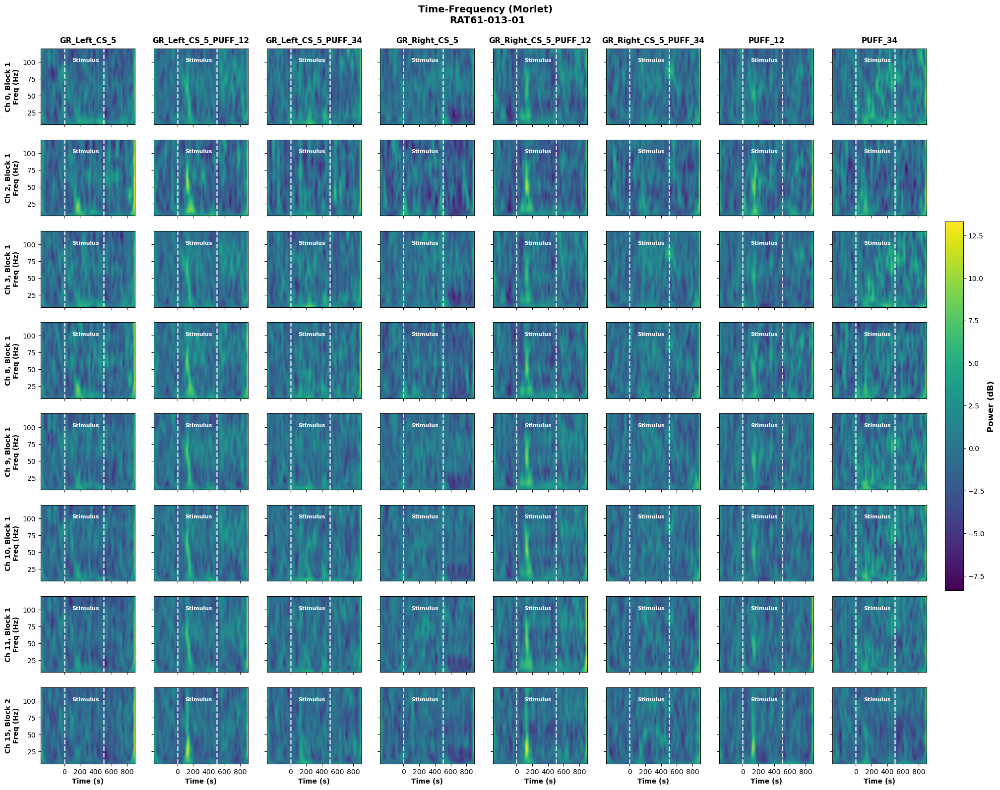

In [21]:
mne.set_log_level('ERROR') 
freqs = np.linspace(7, 120, 80)    
n_cycles = np.maximum(3, freqs / 10) 

n_groups = len(conditions)
n_channels = len(channel_ids)

n_times = prestim_len + poststim_len
times = np.arange(n_times) / float(sfreq) - (prestim_len / float(sfreq))

fig, axes = plt.subplots(n_channels, n_groups,
                         figsize=(3 * n_groups, 2.2 * n_channels),
                         sharex=True, sharey=True)

tfr_data_all = [] 

for i, (channel, subunit) in enumerate(channelwithspike.itertuples(index=False)):
    
    tfr_list = []

    for g in conditions:
        trials = LFP_zscore_by_cond[g][:, i, :]

        data = trials[:, None, :].astype(np.float64)  

        tfr = mne.time_frequency.tfr_array_morlet(data, sfreq=sfreq,
                                                  freqs=freqs, n_cycles=n_cycles,
                                                  output='power', decim=1, n_jobs=1)
        tfr_power = np.mean(tfr, axis=0).squeeze() 

        pre_idx = np.where(times < 0)[0]
        baseline_power = np.mean(tfr_power[:, pre_idx], axis=1, keepdims=True)
        baseline_power[baseline_power <= 0] = np.finfo(float).eps
        tfr_power[tfr_power <= 0] = np.finfo(float).eps

        tfr_db = 10 * np.log10(tfr_power / baseline_power)

        tfr_list.append(tfr_db)

    tfr_data_all.append(tfr_list)


all_valid_data = []
for r, tfr_list in enumerate(tfr_data_all):
    for tfr_cond in tfr_list:
        if not np.all(np.isnan(tfr_cond)):
            all_valid_data.extend(tfr_cond[np.isfinite(tfr_cond)])

all_valid_data = np.array(all_valid_data)
global_vmin = np.min(all_valid_data)
global_vmax = np.max(all_valid_data)
    

for i, (channel, subunit) in enumerate(channelwithspike.itertuples(index=False)):
    tfr_list = tfr_data_all[i]

    for c, g in enumerate(conditions):
        ax = axes[i, c]

        im = ax.pcolormesh(times, freqs, tfr_list[c], shading='auto', cmap='viridis', vmin=global_vmin, vmax=global_vmax)
        ax.axvline(0, color='w', linestyle='--', linewidth=1.8, alpha=0.8)
        ax.axvline(0.5, color='w', linestyle='--', linewidth=1.8, alpha=0.8)
        ax.text(0.1, 100, 'Stimulus', color='w', fontsize=8, fontweight='bold')

        if c == 0:
            ax.set_ylabel(f"Ch {channel}, Block {subunit+1}\nFreq (Hz)", fontsize=10, fontweight='bold')
        if i == n_channels - 1:
            ax.set_xlabel('Time (s)', fontsize=10, fontweight='bold')
        if i == 0:
            ax.set_title(g, fontsize=11, fontweight='bold', pad=8)

        ax.set_xticks(np.arange(0, 0.9 + 0.0001, 0.2))  
        ax.set_xticklabels([str(int(t * 1000 - 100)) for t in np.arange(0.1, 0.9 + 0.0001, 0.2)])


        ax.set_ylim(freqs.min(), freqs.max())
        ax.set_xlim(times[0], times[-1])

fig.subplots_adjust(top=0.93)
cbar = fig.colorbar(im, ax=axes.ravel().tolist(), orientation='vertical',
                    fraction=0.02, pad=0.02)  
cbar.set_label('Power (dB)', fontsize=12, fontweight='bold')

plt.suptitle(f'Time-Frequency (Morlet) \n{rat_name}', fontsize=14, fontweight='bold')
plt.savefig(os.path.join(output, f'{rat_name}_LFP_TFR_Morlet_per_channel_by_cond.svg'), dpi=300, bbox_inches='tight', format='svg', transparent=True)
plt.show()

## 2. Power band des ondes

In [80]:
bands = {
    'delta': (1.0, 4.0),
    'theta': (4.5, 8.5),
    'alpha': (8.5, 13.0),
    'beta': (13.0, 30.0),
    'low_gamma': (30.0, 60.0),
    'high_gamma': (60.0, 120.0)
}

## 3. Sliding-window test

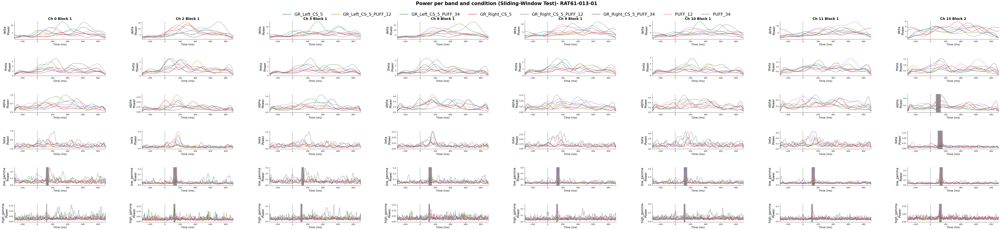

,channel,block,band,n_groups,min_n_trials,sig_time_ranges_ms
0,0,1,delta,8,20,[]
1,0,1,theta,8,20,[]
2,0,1,alpha,8,20,[]
3,0,1,beta,8,20,[]
4,0,1,low_gamma,8,20,"[(112, 121), (114, 123), (116, 125), (118, 127..."
5,0,1,high_gamma,8,20,"[(116, 125), (118, 127), (120, 129)]"
6,2,1,delta,8,20,[]
7,2,1,theta,8,20,[]
8,2,1,alpha,8,20,[]
9,2,1,beta,8,20,[]


,channel,block,band,time_start_ms,time_end_ms,group1,group2,p_dunn,sig
0,0,1,low_gamma,112,121,GR_Left_CS_5,GR_Left_CS_5_PUFF_12,0.962076,
1,0,1,low_gamma,112,121,GR_Left_CS_5,GR_Left_CS_5_PUFF_34,1.000000,
2,0,1,low_gamma,112,121,GR_Left_CS_5,GR_Right_CS_5,1.000000,
3,0,1,low_gamma,112,121,GR_Left_CS_5,GR_Right_CS_5_PUFF_12,0.876127,
4,0,1,low_gamma,112,121,GR_Left_CS_5,GR_Right_CS_5_PUFF_34,1.000000,
...,...,...,...,...,...,...,...,...,...
7639,15,2,high_gamma,140,149,GR_Right_CS_5_PUFF_12,PUFF_12,1.000000,
7640,15,2,high_gamma,140,149,GR_Right_CS_5_PUFF_12,PUFF_34,0.978453,
7641,15,2,high_gamma,140,149,GR_Right_CS_5_PUFF_34,PUFF_12,0.007204,True
7642,15,2,high_gamma,140,149,GR_Right_CS_5_PUFF_34,PUFF_34,1.000000,


In [81]:
n_plot = len(channel_ids)
n_rows, n_cols = 1, n_plot
n_bands = len(bands)
palette = plt.cm.tab10.colors
group_colors = {g: palette[i % len(palette)] for i, g in enumerate(conditions)}

window_ms = 10
step_ms = 2
alpha = 0.05
win_samps = max(1, int(round(window_ms * sfreq / 1000.0)))
step_samps = max(1, int(round(step_ms * sfreq / 1000.0)))

results_kruskal = []
results_dunn = []

fig = plt.figure(figsize=(10 * n_cols, 3 * n_bands))
outer = gridspec.GridSpec(n_rows, n_cols, figure=fig, wspace=0.4, hspace=1)

for idx, (channel, subunit) in enumerate(channelwithspike.itertuples(index=False)):
    c = idx % n_cols
    inner = outer[c].subgridspec(n_bands, 1, hspace=1)

    trials_by_group = {g: LFP_zscore_by_cond[g][:, idx, :] for g in conditions}

    for band_idx, (band_name, (lfr, hfr)) in enumerate(bands.items()):
        ax = fig.add_subplot(inner[band_idx])

        power_by_group = {}
        for g, trials in trials_by_group.items():
            if trials.size == 0:
                continue
            trials = np.array(trials, dtype=np.float64)
            trials_filt = mne.filter.filter_data(trials.copy(), sfreq=sfreq,
                                                 l_freq=lfr, h_freq=hfr, verbose='ERROR')
            analytic = hilbert(trials_filt, axis=1)
            power = np.abs(analytic) ** 2
            power_by_group[g] = power
            mean_pow = power.mean(axis=0)
            ax.plot(time_ms, mean_pow, label=g if band_idx == 0 else None, color=group_colors[g], linewidth=1.2)

        groups = list(power_by_group.keys())

        min_n = min(power_by_group[g].shape[0] for g in groups)
        n_windows = max(1, (power_by_group[groups[0]].shape[1] - win_samps) // step_samps + 1)
        p_vals = np.ones(n_windows) * np.nan

        for w in range(n_windows):
            start = w * step_samps
            stop = start + win_samps
            samples = [power_by_group[g][:min_n, start:stop].mean(axis=1) for g in groups]
            f, p = kruskal(*samples)
            p_vals[w] = p

        valid_mask = ~np.isnan(p_vals)
        if valid_mask.sum() > 0:
            rej, p_corr, _, _ = multipletests(p_vals[valid_mask], alpha=alpha, method='fdr_bh')
            p_vals[valid_mask] = p_corr
            sig_mask = (p_vals < alpha)
        else:
            sig_mask = np.zeros_like(p_vals, dtype=bool)

        sig_ranges = []
        for w, sig in enumerate(sig_mask):
            if not sig:
                continue
            start = w * step_samps
            stop = start + win_samps - 1
            ts, te = int(time_ms[start]), int(time_ms[min(stop, power_by_group[groups[0]].shape[1]-1)])
            ax.axvspan(ts, te, color='gray', alpha=0.25)
            sig_ranges.append((ts, te))


            groups = list(power_by_group.keys())
            min_n = min(power_by_group[g].shape[0] for g in groups)

            samples_per_group = [power_by_group[g][:min_n, start:stop].mean(axis=1) for g in groups]

            long_data = []
            for i, g in enumerate(groups):
                for val in samples_per_group[i]:
                    long_data.append({'val': val, 'group': g})

            df_long = pd.DataFrame(long_data)
            df_posthoc = sp.posthoc_dunn(df_long, val_col='val', group_col='group', p_adjust='bonferroni')


            for i, g1 in enumerate(groups):
                for j, g2 in enumerate(groups):
                    if j <= i:
                        continue 
                    p_val = df_posthoc.iloc[i, j]
                    results_dunn.append({
                        'channel': channel,
                        'block': subunit+1,
                        'band': band_name,
                        'time_start_ms': ts,
                        'time_end_ms': te,
                        'group1': g1,
                        'group2': g2,
                        'p_dunn': p_val,
                        'sig': 'True' if p_val < alpha else ''
                    })


        results_kruskal.append({
            'channel': channel,
            'block': subunit+1,
            'band': band_name,
            'n_groups': len(groups),
            'min_n_trials': min_n,
            'sig_time_ranges_ms': sig_ranges
        })

        ax.axvline(0, color='k', linestyle='--', alpha=0.6)
        if band_idx == 0:
            ax.set_title(f'Ch {channel} Block {subunit+1}', fontsize=18, fontweight='bold')
        ax.set_ylabel(f'{band_name}\nPower', fontsize=16)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_xlim(time_ms.min(), time_ms.max())
        ax.set_xlabel('Time (ms)', fontsize=14)

handles = [Line2D([0], [0], color=group_colors[g], lw=2) for g in conditions]
fig.legend(handles, conditions, loc='upper center', bbox_to_anchor=(0.5, 0.95),
           ncol=len(conditions), frameon=False, fontsize=22)
plt.suptitle(f'Power per band and condition (Sliding-Window Test)- {rat_name}', fontsize=25, fontweight='bold')
plt.subplots_adjust(left=0.05, right=0.95, top=0.9, bottom=0.08, hspace=0.6, wspace=0.4)
plt.savefig(os.path.join(output,f'{rat_name}_LFP_band_power_sliding_window_test_by_cond.svg'), dpi=900, bbox_inches='tight', format='svg', transparent=True)
plt.show()

df_kruskal = pd.DataFrame(results_kruskal)
df_dunn = pd.DataFrame(results_dunn)
if not df_kruskal.empty:
    display(df_kruskal)
    df_kruskal.to_csv(os.path.join(output,f'{rat_name}_kruskal_band_windows_by_cond.csv'), index=False)
if not df_dunn.empty:
    display(df_dunn)
    df_dunn.to_csv(os.path.join(output,f'{rat_name}_dunn_posthoc_signif_by_cond.csv'), index=False)

## 4. Quantifs du sliding-window test

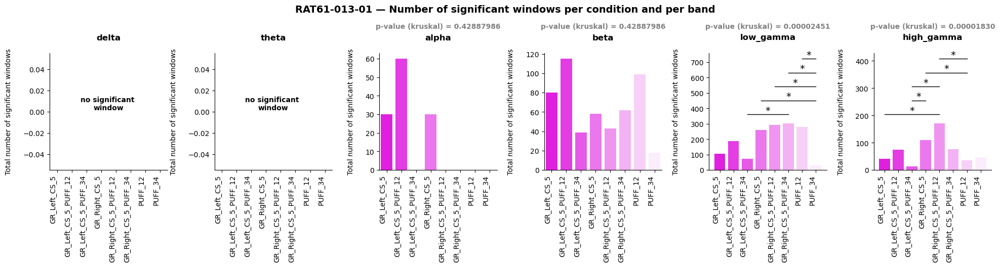

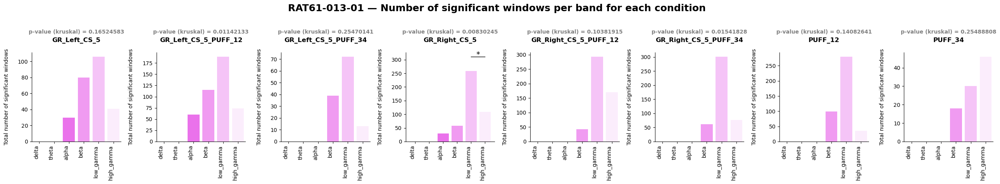

In [82]:
alpha=0.05
df_dunn['sig_window'] = (df_dunn['p_dunn'] < alpha).astype(int)
liste_bandes = list(bands.keys())

def create_barplot(ax, df_counts, groupes, nb_fen, hue, palette, title, conditions_or_bands):
    sns.barplot(data=df_counts, x=groupes, y=nb_fen, hue=hue, palette=palette, dodge=False, legend=False, ax=ax)
    ax.set_xticks(np.arange(len(conditions_or_bands)))
    ax.set_xticklabels(conditions_or_bands, rotation=90, ha='right')
    ax.set_xlabel("")
    ax.set_ylabel("Total number of significant windows\n")
    ax.set_title(f'{title}\n', fontsize=12, fontweight='bold')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    return ax

def add_pvalue_annotations(ax, val_par_groupe, groupes, heights, alpha):

    groupes_pas_vide = [i for i, vals in enumerate(val_par_groupe) if len(vals) > 0]

    if len(groupes_pas_vide) >= 3:

        vals_pour_kruskal = [val_par_groupe[i] for i in groupes_pas_vide]
        H, p_kruskal = kruskal(*vals_pour_kruskal)

        

        ax.text(0.5, 1.2, f'p-value (kruskal) = {p_kruskal:.8f}', ha='center', va='bottom', color='grey', fontsize=10, fontweight='bold', transform=ax.transAxes)

        if p_kruskal < alpha:
            long_data = []
            for i in groupes_pas_vide:
                group_name = groupes[i]
                for val in val_par_groupe[i]:
                    long_data.append({'val': val, 'group': group_name})
            df_posthoc_long = pd.DataFrame(long_data)

            p_dunn = sp.posthoc_dunn(df_posthoc_long, val_col='val', group_col='group', p_adjust='bonferroni')

            top = max(heights) if len(heights) > 0 else 1
            offset_counter = 0
            offset_step = 0.3 * top

            for i, j in itertools.combinations(groupes_pas_vide, 2):
                g1 = groupes[i]
                g2 = groupes[j]
                p_bonf = p_dunn.loc[g1, g2]

                if p_bonf < alpha:
                    y = top + 0.2 * top + offset_counter * offset_step
                    ax.plot([i, j], [y, y], color='black', lw=1)
                    ax.text((i + j) / 2, y - 0.02 * top, '*', ha='center', va='bottom', fontsize=14)
                    offset_counter += 1


cmap = LinearSegmentedColormap.from_list('fuchsia_scale', ['#fdeaff', '#ff00ff'])

fig1, axes1 = plt.subplots(1, len(liste_bandes), figsize=(4 * len(liste_bandes), 3))
axes1 = np.atleast_1d(axes1)

for ax, band in zip(axes1, liste_bandes):

    df_band = df_dunn[df_dunn['band'] == band]
    values_per_condition_total = []

    for g in conditions:

        vals = df_band[(df_band['group1'] == g) | (df_band['group2'] == g)]['sig_window'].values
        values_per_condition_total.append(np.asarray(vals, dtype=int))

    n_signif_windows_total = [vals.sum() for vals in values_per_condition_total]
    df_counts_total = pd.DataFrame({'condition': conditions, 'n_signif_windows': n_signif_windows_total})
    palette = [cmap(v) for v in np.linspace(1.0, 0.0, len(df_counts_total))]

    ax = create_barplot(ax, df_counts_total, 'condition', 'n_signif_windows', 'condition', palette, band, conditions)
    
    if df_counts_total['n_signif_windows'].sum() == 0:
        ax.text(0.5, 0.5, f'no significant \nwindow', ha='center', va='bottom', color='black', fontsize=10, fontweight='bold', transform=ax.transAxes)

    heights = df_counts_total['n_signif_windows'].values
    val_par_cond_par_channel = []
    channels = df_band['channel'].unique()
   
    for g in conditions:

        total_par_channel = []

        for ch in channels:
            n_sig = df_band[(df_band['channel'] == ch) & ((df_band['group1'] == g) | (df_band['group2'] == g))]['sig_window'].sum()
            total_par_channel.append(n_sig)

        val_par_cond_par_channel.append(np.array(total_par_channel))

    add_pvalue_annotations(ax, val_par_cond_par_channel, conditions, heights, alpha)

plt.suptitle(f'{rat_name} — Number of significant windows per condition and per band\n', fontsize=14, fontweight='bold', y=1.2)
fig1.subplots_adjust(wspace=0.4)
plt.savefig(os.path.join(output, f'{rat_name}_LFP_signif_windows_per_band_by_cond.svg'), dpi=300, bbox_inches='tight', format='svg', transparent=True)
plt.show()

fig2, axes2 = plt.subplots(1, len(conditions), figsize=(4 * len(conditions), 3))
axes2 = np.atleast_1d(axes2)

for ax, g in zip(axes2, conditions):
    barre_par_bande = []
    val_par_bande_par_channel = []

    for band in liste_bandes:
        df_band = df_dunn[df_dunn['band'] == band]
      
        if df_band.empty:
            somme_par_cannal = np.array([], dtype=int)
        else:
            somme_par_cannal = (df_band[(df_band['sig_window'] == 1) & ((df_band['group1'] == g) | (df_band['group2'] == g))].groupby(['channel', 'block']).size())
        
        val_par_bande_par_channel.append(somme_par_cannal)
        barre_par_bande.append(int(somme_par_cannal.sum()) if somme_par_cannal.size > 0 else 0)

    df_counts = pd.DataFrame({'band': liste_bandes, 'n_signif_windows': barre_par_bande})

    palette = [cmap(v) for v in np.linspace(1.0, 0.0, len(df_counts))]

    ax = create_barplot(ax, df_counts, 'band', 'n_signif_windows', 'band', palette, g, liste_bandes)

    heights = df_counts['n_signif_windows'].values
   
    add_pvalue_annotations(ax, val_par_bande_par_channel, liste_bandes, heights, alpha)

plt.suptitle(f'{rat_name} — Number of significant windows per band for each condition', fontsize=18, fontweight='bold', y=1.3)
fig2.subplots_adjust(wspace=0.4)
plt.savefig(os.path.join(output, f'{rat_name}_LFP_significant_windows_per_cond_by_band.svg'), dpi=300, bbox_inches='tight', format='svg', transparent=True)
plt.show()

# **IV - Analyse des activités unitaires**

## 1. Catégorisation des neurones

Ici, on étudie tous les fichiers

In [83]:
rat_files = {
    'RAT61-013-01': 'RAT61-013-01.mat',
    'RAT61-014-01': 'RAT61-014-01.mat'
}


 RAT61-013-01


 RAT61-014-01

Classification enregistrée dans neuron_categories.csv


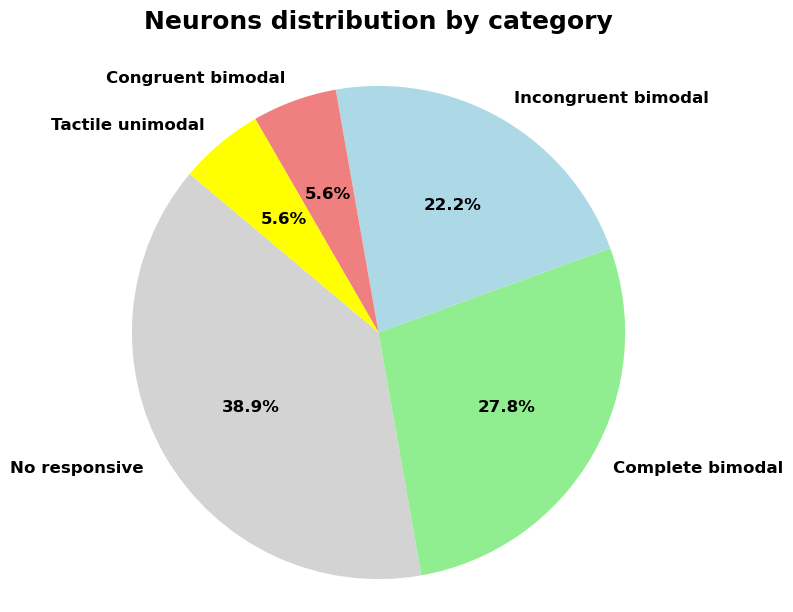

In [84]:
neuron_categories = []
output = 'output_catego'
resp_win = (0, 600)
time_ms = np.arange(-300, 900)
window_size = 20
step_size = 10
windows = [(start, start + window_size) for start in range(resp_win[0], resp_win[1]-window_size+1, step_size)]
alpha = 0.05

from scipy.stats import ttest_1samp

for rat_name, file_path in rat_files.items():
    print(f"\n {rat_name}\n")
    data = sio.loadmat(file_path)
    SpikeTiming = data['t_spike_su']
    StimStart = data['stim_start']
    block = data['block']
    
    triallist_clean = [str(block[trial][0]).strip("[]'\"") for trial in range(block.shape[0])]
    
    channelwithspike = []
    sualigned = np.zeros((16, 4), dtype=object)
    
    for i in range(16):
        for j in range(4):
            if len(SpikeTiming[i][j]) > 1:
                channelwithspike.append((i, j))
                spike_times = np.array(SpikeTiming[i][j]).astype(int)
                max_idx = int(spike_times.max())
                su = np.zeros(max_idx, dtype=float)
                su[spike_times - 1] = 1
                
                n_trials = len(StimStart)
                sualigned[i, j] = np.zeros((n_trials, 1200), dtype=float)
                su_len = su.shape[0]
                
                for trial_idx in range(n_trials):
                    onset = int(StimStart[trial_idx, 0])
                    start_idx = onset - 300 - 1
                    end_idx = start_idx + 1200
                    src_start = max(0, start_idx)
                    src_end = min(su_len, end_idx)
                    if src_start >= src_end:
                        continue
                    dest_start = src_start - start_idx
                    dest_end = dest_start + (src_end - src_start)
                    sualigned[i, j][trial_idx, dest_start:dest_end] = su[src_start:src_end]
    
    def classify_condition(cond):
        is_gr_left = 'GR_Left' in cond
        is_gr_right = 'GR_Right' in cond
        has_puff12 = 'PUFF_12' in cond
        has_puff34 = 'PUFF_34' in cond
        has_puff = 'PUFF' in cond
        has_gr = 'GR_' in cond

        if has_gr and not has_puff:
            return 'visual'
        elif has_puff and not has_gr:
            return 'tactile'
        else:
            if (has_puff12 and is_gr_left) or (has_puff34 and is_gr_right):
                return 'multisens_congruent'
            else:
                return 'multisens_incongruent'

    unique_cond_to_group = {cond: classify_condition(cond) for cond in set(triallist_clean)}
    group_order = ['tactile', 'visual', 'multisens_congruent', 'multisens_incongruent']

    for ch, su_idx in channelwithspike:
        data_neuron = sualigned[ch, su_idx]
        n_trials = data_neuron.shape[0]
        responding = []

        for g in group_order:
            cond_idxs = [i for i, t in enumerate(triallist_clean) if unique_cond_to_group[t] == g]
            if len(cond_idxs) == 0:
                responding.append(False)
                continue

            cond_data = data_neuron[cond_idxs, :]
            baseline_mask = (time_ms < 0) & (time_ms >= -300)
            baseline_spikes = cond_data[:, baseline_mask].sum(axis=1)
            baseline_spikes_moy = baseline_spikes*(20/300)

            neuron_resp = False

            for w_start, w_end in windows:
                window_mask = (time_ms >= w_start) & (time_ms < w_end)
                window_spikes = cond_data[:, window_mask].sum(axis=1)

                if np.all(window_spikes == 0):
                                    p = 1.0
                
                else:
                    stat, p_shapiro = shapiro(window_spikes)
                    normal = p_shapiro >= alpha

                    if normal:
                        if baseline_spikes_moy == 0 :
                            stats, p = ttest_1samp(window_spikes, popmean=0)
                        else:
                            stat, p = ttest_rel(window_spikes, baseline_spikes_moy)
                    else:
                        stat, p = wilcoxon(window_spikes, baseline_spikes_moy)

                p_corrige = p * len(windows)

                if p_corrige < alpha:
                    neuron_resp = True
                    break


            responding.append(neuron_resp)


        if not np.any(responding):
            category = 'No responsive'
        elif responding[0] and not np.any(responding[1:]):
            category = 'Tactile unimodal'
        elif responding[1] and not np.any(responding[0] + responding[2] + responding[3]):
            category = 'Visual unimodal'
        elif responding[2] and not responding[3]:
            category = 'Congruent bimodal'
        elif responding[3] and not responding[2]:
            category = 'Incongruent bimodal'
        elif responding[2] and responding[3]:
            category = 'Complete bimodal'

        neuron_categories.append({
            'rat': rat_name,
            'channel': ch,
            'unit': su_idx,
            'category': category
        })

df_categories = pd.DataFrame(neuron_categories)
df_categories.to_csv('neuron_categories.csv', index=False)
print("Classification enregistrée dans neuron_categories.csv")
category_counts = df_categories['category'].value_counts()
labels = category_counts.index
sizes = category_counts.values

color_map = {
    'Complete bimodal': 'lightgreen',
    'No responsive': 'lightgray',
    'Visual unimodal': 'plum',
    'Congruent bimodal': 'lightcoral',
    'Incongruent bimodal': 'lightblue',
    'Tactile unimodal': 'yellow'
}
colors = [color_map.get(lbl, 'lightgray') for lbl in labels]

plt.figure(figsize=(7,7))
plt.pie(sizes, labels=labels, colors=colors, textprops={'fontsize': 12, 'weight': 'bold'}, autopct='%1.1f%%', startangle=140)
plt.title('Neurons distribution by category', fontsize=18, fontweight='bold', pad=25)
plt.axis('equal')
plt.savefig(os.path.join(output,'neuron_category_distribution_shapiro.svg'), dpi=900, bbox_inches='tight', format='svg', transparent=True)
plt.show()

## 2. Observation de chaque neurone

Ici, on fait par fichier 

In [85]:
rat_name = 'RAT61-013-01'
output = f'output_{rat_name}'

In [86]:
Unit_activity_by_group = np.load(f"output_{rat_name}/{rat_name}_UnitActivity_by_group.npy", allow_pickle=True).item()
Unit_activity_by_condition = np.load(f"output_{rat_name}/{rat_name}_UnitActivity_by_condition.npy", allow_pickle=True).item()

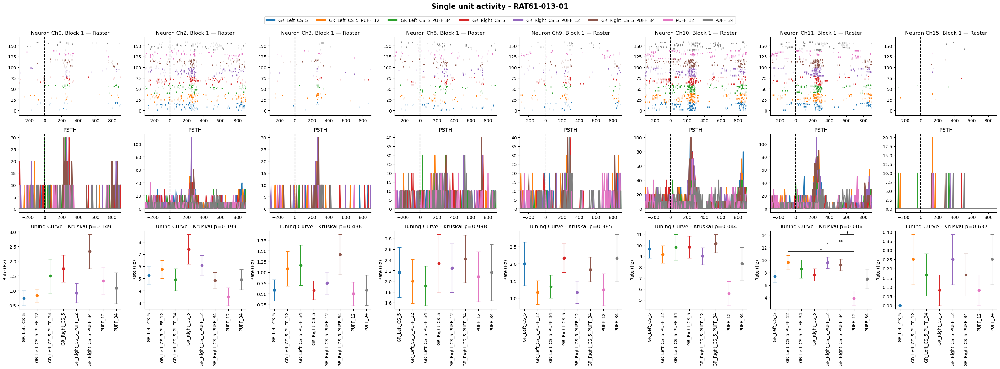

In [87]:
group_order = list(Unit_activity_by_group.keys())
cond_order = list(Unit_activity_by_condition.keys())


def plot_raster_psth_tuning(Unit_activity_dict, order, rat_name, cond, resp_win=(0,600), bin_width_ms=5, alpha=0.05):
    
    time_ms = np.arange(-300, 900)
        
    bin_width_s = bin_width_ms / 1000
    bins = np.arange(time_ms.min(), time_ms.max() + bin_width_ms, bin_width_ms)
    cm = plt.cm.tab10
    group_colors = {g: cm(i % 10) for i, g in enumerate(order)}

    n_neurons = Unit_activity_dict[order[0]].shape[1]
    fig, axes = plt.subplots(3, n_neurons, figsize=(4*n_neurons, 12))
    axes = np.atleast_2d(axes)

    for neuron_idx in range(n_neurons):
        ax_raster, ax_psth, ax_tuning = axes[:, neuron_idx]
        (channel, subunit) = channelwithspike[neuron_idx]

        # Raster plot
        spike_times_all = []
        colors_all = []
        for g in order:
            trials = Unit_activity_dict[g][:, neuron_idx, :]
            for tr in trials:
                spike_times_all.append(time_ms[np.where(tr==1)[0]])
                colors_all.append(group_colors[g])
        ax_raster.eventplot(spike_times_all, colors=colors_all, linelengths=3, linewidths=1)
        ax_raster.axvline(0, color='k', linestyle='--')
        ax_raster.set_xlim(time_ms.min(), time_ms.max())
        ax_raster.set_title(f"Neuron Ch{channel}, Block {subunit+1} — Raster")

        # PSTH
        for g in order:
            trials = Unit_activity_dict[g][:, neuron_idx, :]
            spike_times = np.hstack([time_ms[np.where(tr==1)[0]] for tr in trials]) if trials.size else np.array([])
            counts, _ = np.histogram(spike_times, bins=bins)
            rate = counts / (len(trials) * bin_width_s) if len(trials) > 0 else np.zeros_like(counts)
            centers = (bins[:-1] + bins[1:]) / 2
            ax_psth.plot(centers, rate, color=group_colors[g], linewidth=2.0)
            ax_psth.fill_between(centers, 0, rate, color=group_colors[g], alpha=0.15)
        ax_psth.axvline(0, color='k', linestyle='--')
        ax_psth.set_xlim(time_ms.min(), time_ms.max())
        ax_psth.set_title("PSTH")

        # Tuning curve
        mean_rates, sem_rates, group_rates = [], [], []
        for g in order:
            trials = Unit_activity_dict[g][:, neuron_idx, :]
            rates = [np.sum((time_ms[np.where(tr==1)[0]] >= resp_win[0]) &
                            (time_ms[np.where(tr==1)[0]] <= resp_win[1])) / ((resp_win[1]-resp_win[0])/1000)
                     for tr in trials]
            rates = np.array(rates)
            mean_rates.append(np.mean(rates) if len(rates)>0 else 0)
            sem_rates.append(np.std(rates, ddof=1)/np.sqrt(len(rates)) if len(rates)>1 else 0)
            group_rates.append(rates)

        x = np.arange(len(order))
        for i, g in enumerate(order):
            ax_tuning.errorbar(x[i], mean_rates[i], yerr=sem_rates[i], fmt='o', color=group_colors[g], capsize=4)

        # Kruskal-Wallis
        valid_groups = [gr for gr in group_rates if len(gr) > 0]
        if len(valid_groups) >= 2:
            stat_kw, p_kw = kruskal(*valid_groups)
            ax_tuning.set_title(f"Tuning Curve - Kruskal p={p_kw:.3f}")
        else:
            p_kw = np.nan

        # Post-hoc Dunn
        if not np.isnan(p_kw) and p_kw < alpha:
            posthoc = sp.posthoc_dunn(valid_groups, p_adjust='bonferroni')
            sig_pairs = [(i,j,posthoc.iloc[i,j]) for i,j in combinations(range(len(valid_groups)),2) if posthoc.iloc[i,j] < alpha]
            y0 = max(mean_rates) + max(sem_rates) + 0.2
            h = 0.2
            offset = 0
            for k, (i1,i2,pv) in enumerate(sig_pairs):
                y = y0 + k*h
                ax_tuning.plot([i1,i1,i2,i2], [y + y*offset,y+h*0.3+ y*offset,y+h*0.3+ y*offset,y + y*offset], color='k', lw=1.2)
                stars = "***" if pv<0.001 else "**" if pv<0.01 else "*"
                ax_tuning.text((i1+i2)/2, y+h*0.4 + y*offset, stars, ha='center')
                offset += 0.1

        ax_tuning.set_xticks(x)
        ax_tuning.set_xticklabels(order, rotation=90)
        ax_tuning.set_ylabel("Rate (Hz)")

        for ax in [ax_raster, ax_psth, ax_tuning]:
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)

    handles = [Line2D([0],[0], color=group_colors[g], lw=3) for g in order]
    fig.legend(handles, order, loc='upper center', ncol=len(order), bbox_to_anchor=(0.5, 0.95))
    plt.suptitle(f"Single unit activity - {rat_name}", fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0,0,1,0.95])
    plt.savefig(os.path.join(output, f'{rat_name}_spike_raster_psth_tuning_kruskal_dunn_{cond}.svg'), dpi=900, bbox_inches='tight', format='svg', transparent=True)
    plt.show()

plot_raster_psth_tuning(Unit_activity_by_condition, cond_order, rat_name, cond='condition')

# **V - Synchronisation spike & LFP**

## **1. Etude de la synchronisation**

In [89]:
rat_name = 'RAT61-013-01'
output = f'output_{rat_name}'

LFP_filtered_by_group_ = np.load(f"output_{rat_name}/{rat_name}_LFP_filtered_by_group.npy", allow_pickle=True).item()
LFP_zscore_by_group = np.load(f"output_{rat_name}/{rat_name}_LFP_zscore_by_group.npy", allow_pickle=True).item()
LFP_filtered_by_cond = np.load(f"output_{rat_name}/{rat_name}_LFP_filtered_by_condition.npy", allow_pickle=True).item()
LFP_zscore_by_cond = np.load(f"output_{rat_name}/{rat_name}_LFP_zscore_by_condition.npy", allow_pickle=True).item()
channelwithspike = pd.read_csv(os.path.join(f'output_{rat_name}', f"{rat_name}_channels_with_spikes.csv"))
channel_ids = channelwithspike.index.tolist()

In [90]:
bands = {
    'delta': (1.0, 4.0),
    'theta': (4.5, 8.5),
    'alpha': (8.5, 13.0),
    'beta': (13.0, 30.0),
    'low_gamma': (30.0, 60.0),
    'high_gamma': (60.0, 120.0)
}

conditions = list(LFP_zscore_by_cond.keys())
n_cond = len(conditions)
n_bands = len(bands)

cm = plt.cm.tab10
cond_colors = {c: cm(i % 10) for i, c in enumerate(conditions)}

onde_colors = {
    'delta': 'blue',
    'theta': 'green',
    'alpha': 'orange',
    'beta': 'red',
    'low_gamma': 'purple',
    'high_gamma': 'brown'
}

### 1. Calculs

In [97]:
n_phase_bins = 10
phase_edges = np.linspace(-np.pi, np.pi, n_phase_bins + 1)
phase_centers = (phase_edges[:-1] + phase_edges[1:]) / 2

per_trial_results = {cond: {band_name: {} for band_name in bands.keys()} for cond in LFP_zscore_by_cond.keys()}
all_spike_phases = {cond: {band: {} for band in bands.keys()} for cond in LFP_zscore_by_cond.keys()}
MRL = {}
Rayleigh_p = {}

def compute_MRL(phases):
    if len(phases) == 0:
        return np.nan
    return np.abs(np.mean(np.exp(1j * phases)))

def rayleigh_test(phases):
    n = len(phases)
    if n == 0:
        return np.nan, np.nan
    R = np.abs(np.sum(np.exp(1j * phases)))
    Z = (R**2) / n
    p = np.exp(-Z) * (1 + (2*Z - Z**2)/(4*n) - (24*Z - 132*Z**2 + 76*Z**3 - 9*Z**4)/(288*n**2))
    return Z, p

units = [(ch, su) for ch, su in channelwithspike.itertuples(index=False)]
conditions = list(LFP_zscore_by_cond.keys())
bands_list = list(bands.keys())

for u_idx, (ch, su) in enumerate(units):
    spikes_for_unit = sualigned[ch, su]
    MRL[(ch, su)] = {cond: {band: np.nan for band in bands_list} for cond in conditions}
    Rayleigh_p[(ch, su)] = {cond: {band: np.nan for band in bands_list} for cond in conditions}

    for band_name, (lfr, hfr) in bands.items():
        for cond in conditions:
            trials = LFP_zscore_by_cond[cond][:, u_idx, :].astype(float)
            if trials.size == 0:
                all_spike_phases[cond][band_name][(ch, su)] = np.array([])
                per_trial_results[cond][band_name][(ch, su)] = {"preferred_phase": np.array([])}
                continue

            trials_band = mne.filter.filter_data(trials.copy(), sfreq=sfreq, l_freq=lfr, h_freq=hfr, verbose='ERROR')
            analytic = hilbert(trials_band, axis=1)
            phase_all = np.angle(analytic)

            phases_list = []
            preferred_per_trial = []

            for t_idx in range(trials_band.shape[0]):
                spikes_idx = np.where(spikes_for_unit[t_idx] == 1)[0]
                if spikes_idx.size:
                    phases_essai = phase_all[t_idx, spikes_idx]
                    phases_list.append(phases_essai)
                    preferred_phase = circmean(phases_essai, high=np.pi, low=-np.pi)
                    preferred_per_trial.append(preferred_phase)
                else:
                    preferred_per_trial.append(np.nan)

            all_phases_unit = np.hstack(phases_list) if phases_list else np.array([])
            all_spike_phases[cond][band_name][(ch, su)] = all_phases_unit
            per_trial_results[cond][band_name][(ch, su)] = {"preferred_phase": np.array(preferred_per_trial)}

            if all_phases_unit.size > 0:
                MRL[(ch, su)][cond][band_name] = compute_MRL(all_phases_unit)
                _, Rayleigh_p[(ch, su)][cond][band_name] = rayleigh_test(all_phases_unit)

### 2. Visualisation d'un essai

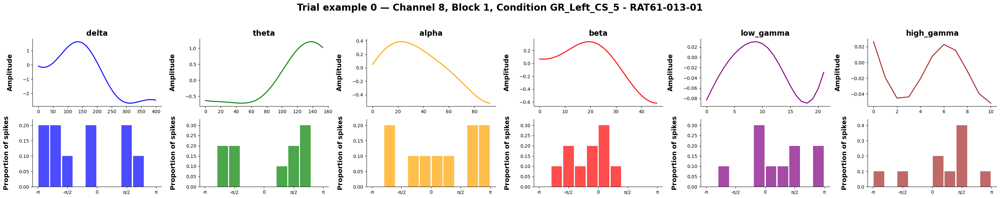

In [98]:
example_channel, example_subunit = 8, 0
example_cond = conditions[0]
example_trial_idx = 0
fig, axes = plt.subplots(2, len(bands_list), figsize=(5*len(bands_list), 6), squeeze=False)

for band_idx, band_name in enumerate(bands_list):
    lfr, hfr = bands[band_name]
    trial_signal = LFP_zscore_by_cond[example_cond][example_trial_idx, example_channel, :].astype(float)
    trial_band = mne.filter.filter_data(trial_signal, sfreq=sfreq, l_freq=lfr, h_freq=hfr, verbose='ERROR')
    spikes = sualigned[example_channel, example_subunit][example_trial_idx]
    phase_all = np.angle(hilbert(trial_band))
    spike_phases = phase_all[spikes==1] if np.any(spikes==1) else np.array([])

    counts, _ = np.histogram(spike_phases, bins=phase_edges)
    proportions = counts / counts.sum() if counts.sum() > 0 else counts

    f_c = (lfr + hfr)/2.0
    period_ms = 1000/f_c
    n_samples = int(np.round(period_ms/1000*sfreq))
    start_idx, end_idx = 300, 300+n_samples
    signal_segment = trial_band[start_idx:end_idx]
    time_segment = time_ms[start_idx:end_idx]

    axes[0, band_idx].plot(time_segment, signal_segment, color=onde_colors[band_name], linewidth=2)
    axes[0, band_idx].set_title(f"{band_name}", fontsize=16, fontweight='bold')
    axes[0, band_idx].set_ylabel("Amplitude\n", fontweight='bold', fontsize=14)
    axes[0, band_idx].spines['top'].set_visible(False)
    axes[0, band_idx].spines['right'].set_visible(False)

    axes[1, band_idx].bar(phase_centers, proportions, width=(phase_edges[1]-phase_edges[0])*0.9,
                          color=onde_colors[band_name], alpha=0.7)
    axes[1, band_idx].set_xticks([-np.pi, -np.pi/2, 0, np.pi/2, np.pi])
    axes[1, band_idx].set_xticklabels(['-π','-π/2','0','π/2','π'])
    axes[1, band_idx].set_ylabel("Proportion of spikes\n", fontweight='bold', fontsize=14)
    axes[1, band_idx].set_ylim(0, proportions.max()*1.1)
    axes[1, band_idx].spines['top'].set_visible(False)
    axes[1, band_idx].spines['right'].set_visible(False)

plt.suptitle(f"Trial example {example_trial_idx} — Channel {example_channel}, Block {example_subunit+1}, Condition {example_cond} - {rat_name}\n",
             fontsize=20, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(output, f'{rat_name}_LFP_example_trial_phase_locking.svg'), dpi=900, bbox_inches='tight', format='svg', transparent=True)
plt.show()

## **2. Phase locking canal par canal**

### 1. Heatmap des MRL & Rayleigh test

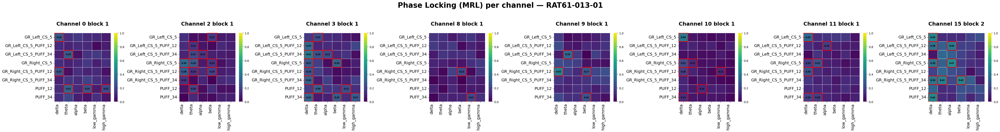

In [99]:
fig, axes = plt.subplots(1, len(units), figsize=(len(units)*6, 6))
for ax, unit in zip(axes, units):
    data_unit = pd.DataFrame([[MRL[unit][cond][band] for band in bands_list] for cond in conditions],
                             index=conditions, columns=bands_list)
    sns.heatmap(data_unit, cmap='viridis', vmin=0, vmax=1, cbar=True, annot=False, linewidths=0.5,
                linecolor='white', ax=ax)
    ax.set_title(f'Channel {unit[0]} block {unit[1]+1}\n', fontsize=18, fontweight='bold')
    ax.set_xticklabels(bands_list, rotation=90, ha='right', fontsize=14)
    ax.set_yticklabels(conditions, rotation=0, fontsize=14)
    for i_cond, cond in enumerate(conditions):
        for j_band, band in enumerate(bands_list):
            pval = Rayleigh_p[unit][cond][band]
            mrl_val = MRL[unit][cond][band]
            if not np.isnan(pval) and pval < 0.05:
                ax.add_patch(plt.Rectangle((j_band, i_cond), 1, 1, fill=False, edgecolor='red', lw=2))
                txt_color = 'white' if (not np.isnan(mrl_val) and mrl_val > 0.5) else 'black'
                ax.text(j_band+0.5, i_cond+0.5, f"{mrl_val:.2f}", ha='center', va='center', color=txt_color,
                        fontweight='bold', fontsize=7)

plt.suptitle(f'Phase Locking (MRL) per channel — {rat_name}', fontsize=25, fontweight='bold', y=1.05)
plt.tight_layout()
plt.savefig(os.path.join(output, f'{rat_name}_LFP_phase_locking_MRL_per_channel.svg'), dpi=900, bbox_inches='tight', format='svg', transparent=True)
plt.show()

### 2. Polar plot - Test de Watson-Williams (selon Liebe et al., 2012)

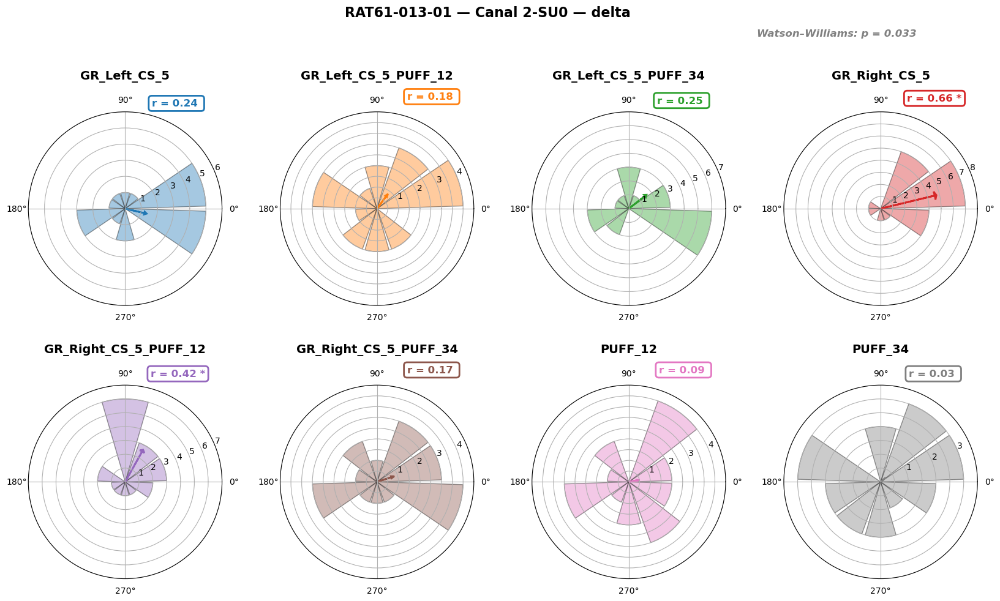

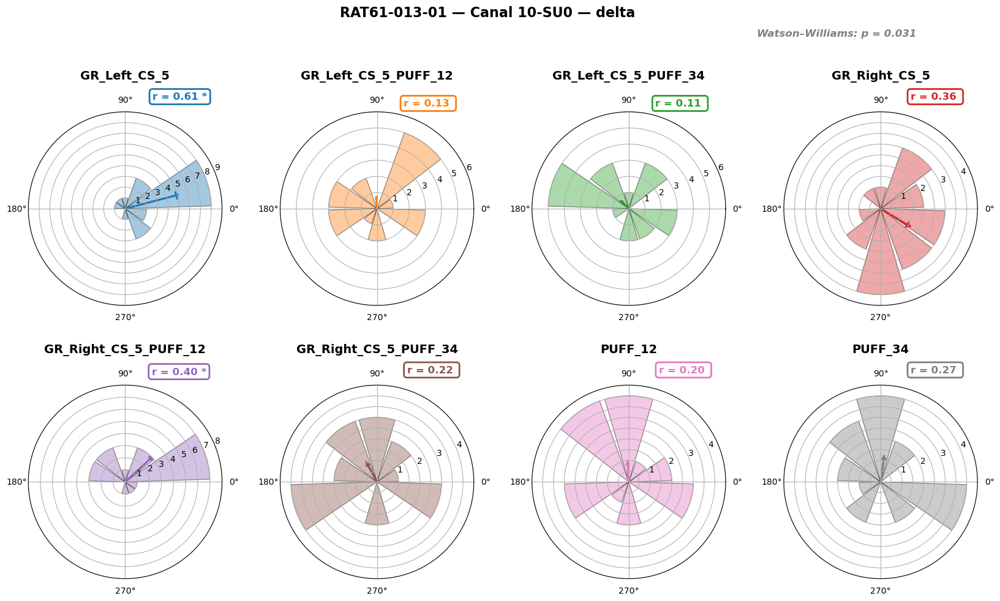

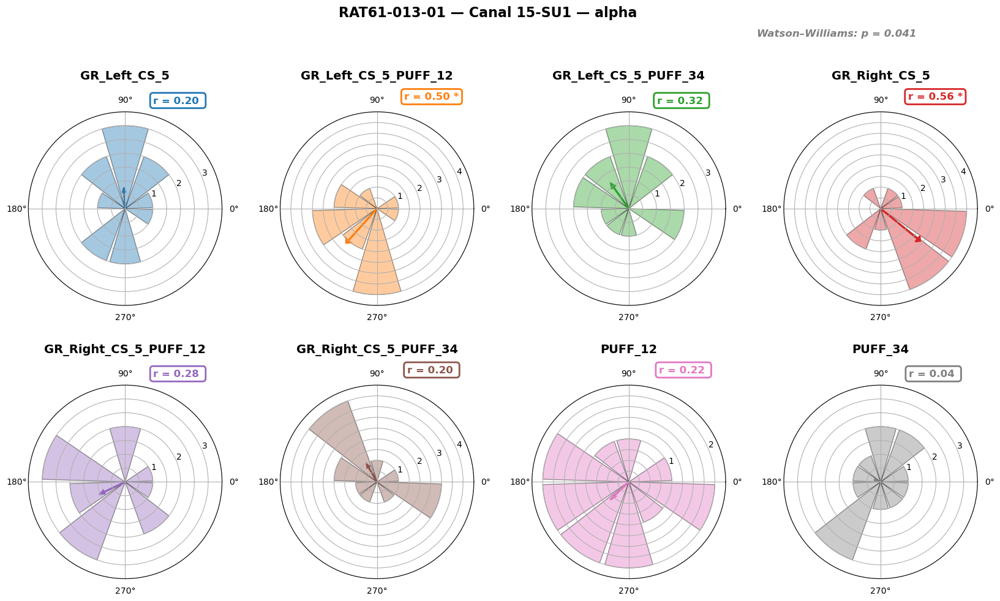

In [100]:
from scipy.stats import f


preferred_phases_by_channel = {
    cond: {band: {} for band in bands.keys()} for cond in per_trial_results.keys()
}

for cond in per_trial_results.keys():
    for band_name in bands.keys():
        for (ch, su), trial_data in per_trial_results[cond][band_name].items():
            phases = trial_data["preferred_phase"]
            phases = phases[~np.isnan(phases)]
            preferred_phases_by_channel[cond][band_name][(ch, su)] = phases

     
def watson_williams_test(groups):
    nb = len(groups)
    n = np.array([len(g) for g in groups])
    N = np.sum(n)

    C = np.zeros(nb, dtype=complex)
    R = np.zeros(nb)

    for i, g in enumerate(groups):
        C[i] = np.sum(np.exp(1j*g))
        R[i] = np.abs(C[i]) / n[i]

    C_total = np.sum(C)
    R_bar = np.abs(C_total) / N

    S = 0
    for i, g in enumerate(groups):
        if n[i] > 0:
            phi_i = np.angle(C[i])
            S += np.sum(np.sin((g - phi_i)/2)**2)

    B = np.sum(n * (R - R_bar) ** 2)

    df_between = nb - 1
    df_within = N - nb

    if S == 0 or (1 - R_bar) == 0:
        return np.nan, np.nan

    F = (B/df_between) / (2 * (1-R_bar) / S)
    p_value = 1 - f.cdf(F, df_between, df_within)
    return F, p_value


def permutation_watson_williams_test(groups, n_permutations=1000):
    n = np.array([len(g) for g in groups])
    all_phases = np.concatenate(groups)

    F_obs, _ = watson_williams_test(groups)
    F_perm = np.zeros(n_permutations)

    for i in range(n_permutations):
        np.random.shuffle(all_phases)
        perm_groups = []

        start = 0
        for size in n:
            perm_groups.append(all_phases[start:start+size])
            start += size

        F_perm[i], _ = watson_williams_test(perm_groups)

    p_value = np.sum(F_perm >= F_obs) / n_permutations
    return F_obs, p_value

def rayleigh_test(phases):

    n = len(phases)

    C = np.sum(np.exp(1j*phases))
    r = np.abs(C) / n
    Z = n * r**2
    p = np.exp(-Z) * (1 + (2*Z - Z**2) / (4*n) - (24*Z - 132*Z**2 + 76*Z**3 - 9*Z**4)/(288*n**2))
    return r, p


for band_name in bands.keys():

    all_channels = set()
    for cond in per_trial_results.keys():
        all_channels.update(preferred_phases_by_channel[cond][band_name].keys())

    for (channel, subunit) in all_channels:

        groups = []
        cond_list = []

        for cond in per_trial_results.keys():
            phases = preferred_phases_by_channel[cond][band_name].get((channel, subunit), np.array([]))
            if len(phases) > 0:
                groups.append(phases)
                cond_list.append(cond)

        if len(groups) <= 1:
            continue  

        F, pval = permutation_watson_williams_test(groups)
        if pval < 0.05:
            n_conditions = len(cond_list)
            n_cols = 4
            n_rows = int(np.ceil(n_conditions / n_cols))

            fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows), subplot_kw={'projection': 'polar'})

            left = fig.subplotpars.left
            right = fig.subplotpars.right
            top = fig.subplotpars.top

            for idx, cond in enumerate(cond_list):

                row = idx // n_cols
                col = idx % n_cols
                ax = axes[row, col]

                phases = preferred_phases_by_channel[cond][band_name][(channel, subunit)]
                phases = np.mod(phases, 2*np.pi)

                counts, bin_edges = np.histogram(phases, bins=np.linspace(0, 2*np.pi, n_phase_bins+1))
                bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

                color = plt.cm.tab10.colors[idx % 10]
                ax.bar(bin_centers, counts, width=(2*np.pi/n_phase_bins)*0.9,
                    color=color, alpha=0.4, edgecolor='k')

                mean_phase = circmean(phases, high=2*np.pi, low=0)
                r = np.abs(np.sum(np.exp(1j*phases)) / len(phases))

                ax.arrow(mean_phase, 0,
                        0, r * counts.max(),
                        head_width=0.15, head_length=0.15,
                        fc=color, ec=color, linewidth=2)

                r_value, p_rayleigh = rayleigh_test(phases)
                signif = "*" if p_rayleigh < 0.05 else "ns"

                ax.text(1.1, counts.max()*1.4,
                        f"r = {r_value:.2f} {signif if p_rayleigh < 0.05 else ''}",
                        ha="center", va="bottom",
                        fontsize=12, fontweight="bold",
                        color=color,
                        bbox=dict(boxstyle="round,pad=0.3", edgecolor=color, facecolor="white", linewidth=2))


                ax.set_title(f'{cond}\n\n', fontsize=14, fontweight='bold')

                r_ticks = ax.get_yticks()
                ax.set_yticks(r_ticks)
                ax.set_yticklabels([str(int(v)) if v.is_integer() else '' for v in r_ticks])

                ax.set_xticks(np.linspace(0, 2*np.pi, 4, endpoint=False))
                ax.set_xticklabels(['0°','90°','180°','270°'])

            fig.text(0.85, 1.01, f'Watson–Williams: p = {pval:.3f}', fontsize=12, fontweight='bold', ha='right', color='grey', fontstyle='italic')
            plt.suptitle(f'{rat_name} — Canal {channel}-SU{subunit} — {band_name}\n', fontsize=16, fontweight='bold', y=1.06)

            plt.subplots_adjust(hspace=0.3, wspace=0.3, top=0.9)
            plt.savefig(os.path.join(output, f'{rat_name}_WW_phase_comparison_Ch{channel}_Su{subunit}_{band_name}.svg'),
                        dpi=600, bbox_inches='tight', format='svg', transparent=True)
            plt.show()

## **3. Phase locking canaux groupés**

### 1. Heatmap des MRL & Rayleigh test

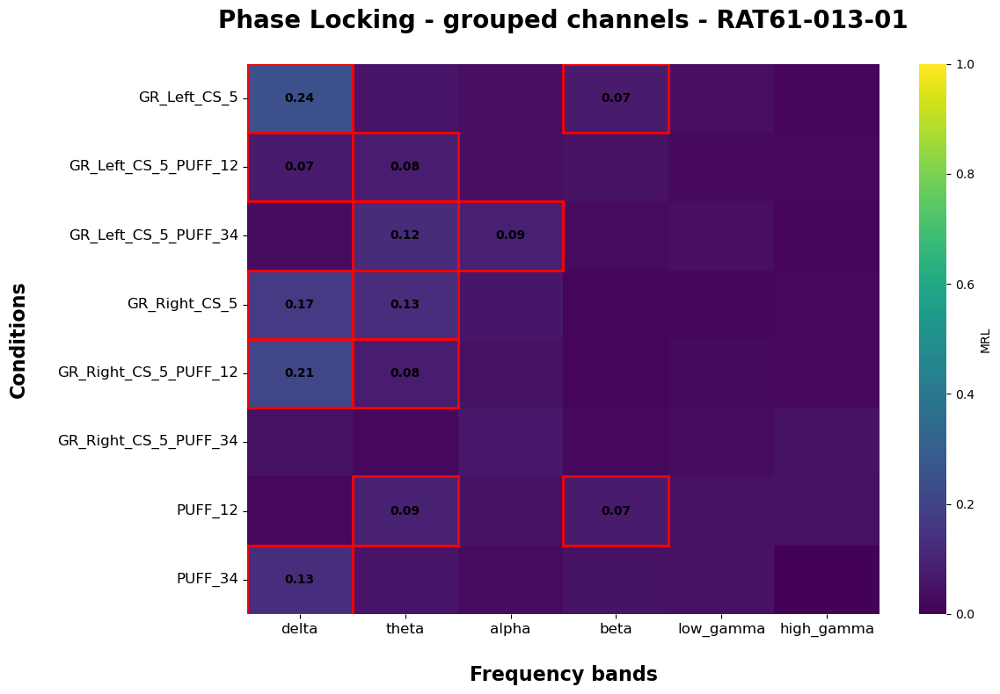

In [101]:
MRL_all_channels = {cond: {band: np.nan for band in bands_list} for cond in conditions}
Rayleigh_p_all_channels = {cond: {band: np.nan for band in bands_list} for cond in conditions}

for cond in conditions:
    for band_name in bands_list:
        phases_list = [phases
                       for (ch, su), phases in all_spike_phases[cond][band_name].items()
                       if phases.size > 0]
        all_phases = np.hstack(phases_list) if phases_list else np.array([])
        MRL_all_channels[cond][band_name] = compute_MRL(all_phases)
        _, Rayleigh_p_all_channels[cond][band_name] = rayleigh_test(all_phases)

df_mrl = pd.DataFrame([[MRL_all_channels[cond][band] for band in bands_list] for cond in conditions], index=conditions, columns=bands_list)
plt.figure(figsize=(12,8))
ax = sns.heatmap(df_mrl, cmap='viridis', vmin=0, vmax=1, cbar_kws={'label':'MRL'}, annot=False)

for i, cond in enumerate(conditions):
    for j, band in enumerate(bands_list):
        mrl_val = df_mrl.iloc[i,j]
        p_val = Rayleigh_p_all_channels[cond][band]
        text_color = 'white' if mrl_val>0.5 else 'black'
        if p_val<0.05:
            ax.text(j+0.5, i+0.5, f"{mrl_val:.2f}", ha='center', va='center', color=text_color, fontweight='bold')
            ax.add_patch(plt.Rectangle((j,i),1,1, fill=False, edgecolor='red', lw=2))

ax.set_title(f'Phase Locking - grouped channels - {rat_name}\n', fontsize=20, fontweight='bold')
ax.set_xlabel('\nFrequency bands', fontsize=16, fontweight='bold')
ax.set_ylabel('Conditions\n', fontsize=16, fontweight='bold')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12, rotation=0)
plt.tight_layout()
plt.savefig(os.path.join(output, f'{rat_name}_LFP_phase_locking_MRL_by_cond_band_grouped_channels.svg'), dpi=900, bbox_inches='tight', format='svg', transparent=True)
plt.show()

### 2. Polar plot - Test de Watson-Williams (selon Liebe et al., 2012)

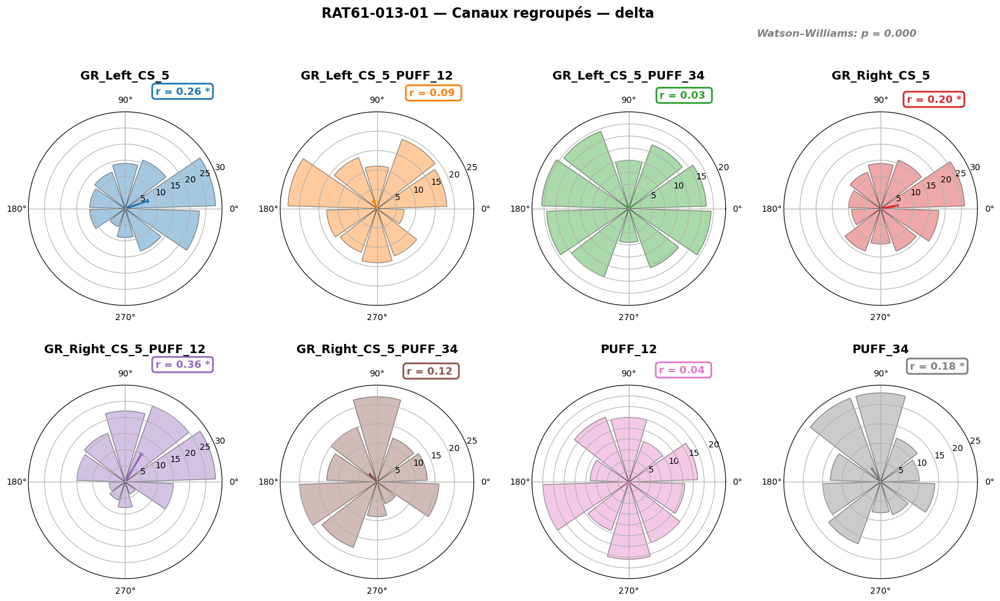

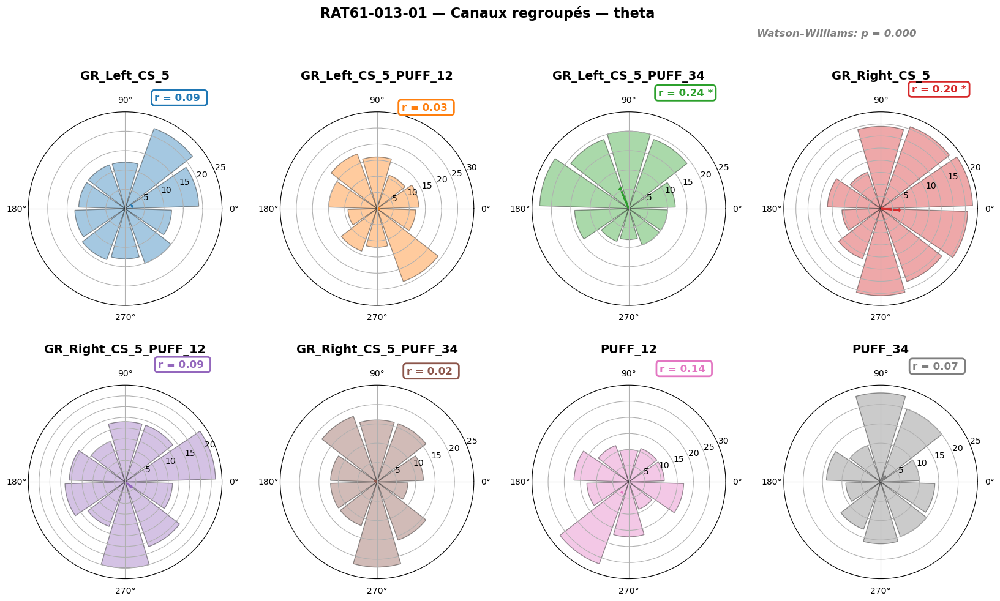

In [102]:
preferred_phases_grouped = {cond: {band: np.array([]) for band in bands.keys()} for cond in conditions}

for cond in conditions:
    for band_name in bands_list:
        phases_list = [trial_data
                       for (ch, su), trial_data in preferred_phases_by_channel[cond][band_name].items()
                       if trial_data.size > 0]
        if phases_list:
            preferred_phases_grouped[cond][band_name] = np.hstack(phases_list)
        else:
            preferred_phases_grouped[cond][band_name] = np.array([])

for band_name in bands_list:

    groups = []
    cond_list = []

    for cond in conditions:
        phases = preferred_phases_grouped[cond][band_name]
        if len(phases) > 0:
            groups.append(phases)
            cond_list.append(cond)

    if len(groups) <= 1:
        continue  

    F, pval = permutation_watson_williams_test(groups)

    if pval < 0.05:

        n_conditions = len(cond_list)
        n_cols = 4
        n_rows = int(np.ceil(n_conditions / n_cols))

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows), subplot_kw={'projection': 'polar'})
        axes = axes.flatten()

        for idx, cond in enumerate(cond_list):
            ax = axes[idx]

            phases = preferred_phases_grouped[cond][band_name]
            phases = np.mod(phases, 2*np.pi)

            counts, bin_edges = np.histogram(phases, bins=np.linspace(0, 2*np.pi, n_phase_bins+1))
            bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

            color = plt.cm.tab10.colors[idx % 10]
            ax.bar(bin_centers, counts, width=(2*np.pi/n_phase_bins)*0.9,
                color=color, alpha=0.4, edgecolor='k')

            mean_phase = circmean(phases, high=2*np.pi, low=0)
            r = np.abs(np.sum(np.exp(1j*phases)) / len(phases))

            ax.arrow(mean_phase, 0,
                    0, r * counts.max(),
                    head_width=0.15, head_length=0.15,
                    fc=color, ec=color, linewidth=2)

            r_value, p_rayleigh = rayleigh_test(phases)
            signif = "*" if p_rayleigh < 0.05 else ""

            ax.text(1.1, counts.max()*1.4,
                    f"r = {r_value:.2f} {signif}",
                    ha="center", va="bottom",
                    fontsize=12, fontweight='bold',
                    color=color,
                    bbox=dict(boxstyle="round,pad=0.3", edgecolor=color, facecolor="white", linewidth=2))

            ax.set_title(f'{cond}\n\n', fontsize=14, fontweight='bold')
            ax.set_xticks(np.linspace(0, 2*np.pi, 4, endpoint=False))
            ax.set_xticklabels(['0°','90°','180°','270°'])
            r_ticks = ax.get_yticks()
            ax.set_yticks(r_ticks)
            ax.set_yticklabels([str(int(v)) if v.is_integer() else '' for v in r_ticks])

        for ax in axes[n_conditions:]:
            fig.delaxes(ax)

        fig.text(0.85, 1.01, f'Watson–Williams: p = {pval:.3f}', fontsize=12, fontweight='bold', ha='right', color='grey', fontstyle='italic')
        plt.suptitle(f'{rat_name} — Canaux regroupés — {band_name}\n', fontsize=16, fontweight='bold', y=1.06)
        plt.subplots_adjust(hspace=0.3, wspace=0.3, top=0.9)
        plt.savefig(os.path.join(output, f'{rat_name}_WW_phase_comparison_grouped_{band_name}.svg'),
                    dpi=600, bbox_inches='tight', format='svg', transparent=True)
        plt.show()



-----------
Traitement des données pour le rat : RAT61-013-01

Channel 0 Block 1 has 664 spikes
Channel 2 Block 1 has 3403 spikes
Channel 3 Block 1 has 258 spikes
Channel 8 Block 1 has 1176 spikes
Channel 9 Block 1 has 1191 spikes
Channel 10 Block 1 has 5479 spikes
Channel 11 Block 1 has 3853 spikes
Channel 15 Block 2 has 95 spikes

 -----------

Traitement des données pour le rat : RAT61-014-01

Channel 0 Block 1 has 2888 spikes
Channel 2 Block 1 has 6866 spikes
Channel 3 Block 1 has 2270 spikes
Channel 8 Block 1 has 2499 spikes
Channel 9 Block 1 has 2112 spikes
Channel 10 Block 1 has 9023 spikes
Channel 11 Block 1 has 3189 spikes
Channel 15 Block 1 has 78 spikes
Channel 15 Block 2 has 581 spikes

 -----------
